# 📈 Lead Scoring Case Study

# Problem Statement

X Education sells online courses to industry professionals.The company markets its courses on several websites and search engines like Google. Once these people land on the website, they might browse the courses or fill up a form for the course or watch some videos.When these people fill up a form providing their email address or phone number, they are classified to be a lead. Moreover, the company also gets leads through past referrals.

Once these leads are acquired, employees from the sales team start making calls, writing emails, etc. Through this process, some of the leads get converted while most do not.The typical lead conversion rate at X education is around 30%.

# Goal of Case Study

X Education needs help in selecting the most promising leads, i.e. the leads that are most likely to convert into paying customers.

The company needs a model wherein a lead score is assigned to each of the leads such that the customers with higher lead score have a higher conversion chance and the customers with lower lead score have a lower conversion chance.

The CEO, in particular, has given a ballpark of the target lead conversion rate to be around 80%.

In [1]:
# Importing all required packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn import metrics

In [2]:
# Loading the dataset
lead = pd.read_csv('./data/Leads.csv')
lead.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


# Analysing the meta data


In [3]:
lead.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [4]:
# checking the null values
lead.isnull().sum()

Prospect ID                                         0
Lead Number                                         0
Lead Origin                                         0
Lead Source                                        36
Do Not Email                                        0
Do Not Call                                         0
Converted                                           0
TotalVisits                                       137
Total Time Spent on Website                         0
Page Views Per Visit                              137
Last Activity                                     103
Country                                          2461
Specialization                                   1438
How did you hear about X Education               2207
What is your current occupation                  2690
What matters most to you in choosing a course    2709
Search                                              0
Magazine                                            0
Newspaper Article           

**Looks like we have got a lot of data missing, it needs to be looked into at a more granular level.**

In [5]:
missing_percentage = round(100*(lead.isnull().sum()/len(lead)),2)
print(missing_percentage)

Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.39
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.48
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.48
Last Activity                                     1.11
Country                                          26.63
Specialization                                   15.56
How did you hear about X Education               23.89
What is your current occupation                  29.11
What matters most to you in choosing a course    29.32
Search                                            0.00
Magazine                                          0.00
Newspaper 

In [6]:
# Making a copy of dataset so the original data is available in hand
lead_copy = lead.copy()

**Dropping the attributes where percentage of missing values exceed 40%.**

In [7]:
lead = lead.drop(['Asymmetrique Activity Index','Asymmetrique Profile Index',
                  'Asymmetrique Activity Score','Asymmetrique Profile Score','Lead Quality'],axis =1)

In [8]:
lead.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Through Recommendations,Receive More Updates About Our Courses,Tags,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,No,Interested in other courses,No,No,Select,Select,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,No,Ringing,No,No,Select,Select,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,No,Will revert after reading the email,No,No,Potential Lead,Mumbai,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,No,Ringing,No,No,Select,Mumbai,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,No,Will revert after reading the email,No,No,Select,Mumbai,No,No,Modified


In [9]:
missing_percentage = round(100*(lead.isnull().sum()/len(lead)),2)
print(missing_percentage)

Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.39
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.48
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.48
Last Activity                                     1.11
Country                                          26.63
Specialization                                   15.56
How did you hear about X Education               23.89
What is your current occupation                  29.11
What matters most to you in choosing a course    29.32
Search                                            0.00
Magazine                                          0.00
Newspaper 

In [10]:
# Printing out the categorical features
categorical_features = []
for label, content in lead.items():
    if not pd.api.types.is_numeric_dtype(content):
        categorical_features.append(label)


In [11]:
# Checking the values of missing % above 20
missing_categorical = round(100*(lead[categorical_features].isnull().sum()/len(lead[categorical_features])),2)

In [12]:
missing_categorical[missing_categorical>20]

Country                                          26.63
How did you hear about X Education               23.89
What is your current occupation                  29.11
What matters most to you in choosing a course    29.32
Tags                                             36.29
Lead Profile                                     29.32
dtype: float64

In [13]:
lead.Country.value_counts()
# it is quite clear that we do not to drop this particular column

India                   6492
United States             69
United Arab Emirates      53
Singapore                 24
Saudi Arabia              21
United Kingdom            15
Australia                 13
Qatar                     10
Hong Kong                  7
Bahrain                    7
Oman                       6
France                     6
unknown                    5
South Africa               4
Nigeria                    4
Germany                    4
Kuwait                     4
Canada                     4
Sweden                     3
China                      2
Asia/Pacific Region        2
Uganda                     2
Bangladesh                 2
Italy                      2
Belgium                    2
Netherlands                2
Ghana                      2
Philippines                2
Russia                     1
Switzerland                1
Vietnam                    1
Denmark                    1
Tanzania                   1
Liberia                    1
Malaysia      

In [14]:
lead['How did you hear about X Education'].value_counts()


Select                   5043
Online Search             808
Word Of Mouth             348
Student of SomeSchool     310
Other                     186
Multiple Sources          152
Advertisements             70
Social Media               67
Email                      26
SMS                        23
Name: How did you hear about X Education, dtype: int64

In [15]:
lead['What is your current occupation'].value_counts()

Unemployed              5600
Working Professional     706
Student                  210
Other                     16
Housewife                 10
Businessman                8
Name: What is your current occupation, dtype: int64

In [16]:
lead['What matters most to you in choosing a course'].value_counts()

Better Career Prospects      6528
Flexibility & Convenience       2
Other                           1
Name: What matters most to you in choosing a course, dtype: int64

In [17]:
lead['Tags'].value_counts()
# Tags seems to be an important variable in business prospect. Therefore, it will be better if we create a new category

Will revert after reading the email                  2072
Ringing                                              1203
Interested in other courses                           513
Already a student                                     465
Closed by Horizzon                                    358
switched off                                          240
Busy                                                  186
Lost to EINS                                          175
Not doing further education                           145
Interested  in full time MBA                          117
Graduation in progress                                111
invalid number                                         83
Diploma holder (Not Eligible)                          63
wrong number given                                     47
opp hangup                                             33
number not provided                                    27
in touch with EINS                                     12
Lost to Others

In [18]:
lead['Lead Profile'].value_counts()

Select                         4146
Potential Lead                 1613
Other Leads                     487
Student of SomeSchool           241
Lateral Student                  24
Dual Specialization Student      20
Name: Lead Profile, dtype: int64

In [19]:
lead['Specialization'].value_counts()

Select                               1942
Finance Management                    976
Human Resource Management             848
Marketing Management                  838
Operations Management                 503
Business Administration               403
IT Projects Management                366
Supply Chain Management               349
Banking, Investment And Insurance     338
Travel and Tourism                    203
Media and Advertising                 203
International Business                178
Healthcare Management                 159
Hospitality Management                114
E-COMMERCE                            112
Retail Management                     100
Rural and Agribusiness                 73
E-Business                             57
Services Excellence                    40
Name: Specialization, dtype: int64

**It can be observed that certain columns have `Select` as a category, which is synonymous to a `NAN`, hence replacing them.**

In [20]:
lead[['Specialization','How did you hear about X Education','Lead Profile','City']] = lead[['Specialization','How did you hear about X Education','Lead Profile','City']].replace('Select',np.nan) 

In [21]:
missing_percentage = round(100*(lead.isnull().sum()/len(lead)),2)
print(missing_percentage)

Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.39
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.48
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.48
Last Activity                                     1.11
Country                                          26.63
Specialization                                   36.58
How did you hear about X Education               78.46
What is your current occupation                  29.11
What matters most to you in choosing a course    29.32
Search                                            0.00
Magazine                                          0.00
Newspaper 

In [22]:
# Again dropping columns with high missing value percentage
lead = lead.drop(['Lead Profile','How did you hear about X Education','City'] ,axis = 1)

In [23]:
missing_percentage = round(100*(lead.isnull().sum()/len(lead)),2)
print(missing_percentage)

Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.39
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.48
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.48
Last Activity                                     1.11
Country                                          26.63
Specialization                                   36.58
What is your current occupation                  29.11
What matters most to you in choosing a course    29.32
Search                                            0.00
Magazine                                          0.00
Newspaper Article                                 0.00
X Educatio

In [24]:
# Removing variables having null value above 30 %
lead = lead.drop(['Tags','Specialization'],axis = 1)

### Following columns have null values for which we can impute or drop while analysing the value:
- Country 
- Lead Source 
- Total Visits 
- Page Views Per Visit 
- Last Activity
- What is your current occupation 
- What matters most to you in choosing a course

In [25]:
# Checking the value of Country
lead.Country.value_counts()


India                   6492
United States             69
United Arab Emirates      53
Singapore                 24
Saudi Arabia              21
United Kingdom            15
Australia                 13
Qatar                     10
Hong Kong                  7
Bahrain                    7
Oman                       6
France                     6
unknown                    5
South Africa               4
Nigeria                    4
Germany                    4
Kuwait                     4
Canada                     4
Sweden                     3
China                      2
Asia/Pacific Region        2
Uganda                     2
Bangladesh                 2
Italy                      2
Belgium                    2
Netherlands                2
Ghana                      2
Philippines                2
Russia                     1
Switzerland                1
Vietnam                    1
Denmark                    1
Tanzania                   1
Liberia                    1
Malaysia      

In [26]:
country_percentage = round(100*len(lead[lead['Country'] == 'India'])/len(lead['Country']),2)
print(country_percentage)

70.26


In [27]:
# Since 'India' occurs 70% of times in country column, and it has 26.63% of missing values, it makes sense to drop this attribute
lead = lead.drop(['Country'], axis =1)

In [28]:
# Checking value counts for the column lead source
lead['Lead Source'].value_counts()

Google               2868
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
bing                    6
google                  5
Click2call              4
Press_Release           2
Social Media            2
Live Chat               2
youtubechannel          1
testone                 1
Pay per Click Ads       1
welearnblog_Home        1
WeLearn                 1
blog                    1
NC_EDM                  1
Name: Lead Source, dtype: int64

In [29]:
# It is quite evident that Google appears twice in different cases, so we should convert all the values into the same case 'Google'
# Also this Lead Source has 0.39% of missing values, we can impute it with the attribute's mode value which also happens to 'Google'

lead['Lead Source'].replace('google','Google',inplace=True)    
lead['Lead Source'].replace(np.nan,'Google',inplace = True)

In [30]:
# Checking the value counts for the column Total Visits

lead['TotalVisits'].value_counts()

0.0      2189
2.0      1680
3.0      1306
4.0      1120
5.0       783
6.0       466
1.0       395
7.0       309
8.0       224
9.0       164
10.0      114
11.0       86
13.0       48
12.0       45
14.0       36
16.0       21
15.0       18
17.0       16
18.0       15
20.0       12
19.0        9
21.0        6
23.0        6
24.0        5
25.0        5
27.0        5
22.0        3
29.0        2
28.0        2
26.0        2
141.0       1
55.0        1
30.0        1
43.0        1
74.0        1
41.0        1
54.0        1
115.0       1
251.0       1
32.0        1
42.0        1
Name: TotalVisits, dtype: int64

In [31]:
# Checking the median of column 

lead['TotalVisits'].median()

3.0

In [32]:
# Replacing the NAN values for TotalVisits by its median
lead['TotalVisits'] = lead['TotalVisits'].replace(np.nan, lead['TotalVisits'].median())

In [33]:
# Checking the value counts for Page Views Per Visit

lead['Page Views Per Visit'].value_counts()

0.00    2189
2.00    1795
3.00    1196
4.00     896
1.00     651
        ... 
3.43       1
2.56       1
6.33       1
1.64       1
2.08       1
Name: Page Views Per Visit, Length: 114, dtype: int64

In [34]:
# Check the median of the column

lead['Page Views Per Visit'].median()

2.0

In [35]:
# Imputing the null values with median of the 'Page Views Per Visit'
lead['Page Views Per Visit'] = lead['Page Views Per Visit'].replace(np.nan, lead['Page Views Per Visit'].median())

In [36]:
# Checking the value counts for the column Last Activity

lead['Last Activity'].value_counts()

Email Opened                    3437
SMS Sent                        2745
Olark Chat Conversation          973
Page Visited on Website          640
Converted to Lead                428
Email Bounced                    326
Email Link Clicked               267
Form Submitted on Website        116
Unreachable                       93
Unsubscribed                      61
Had a Phone Conversation          30
Approached upfront                 9
View in browser link Clicked       6
Email Received                     2
Email Marked Spam                  2
Visited Booth in Tradeshow         1
Resubscribed to emails             1
Name: Last Activity, dtype: int64

In [37]:
# Since we do not have any information of what the last activity of the customer would have been, we can add a new category 
# called 'Not Sure' for the null values in order to avoid potential loss of information

lead['Last Activity'] = lead['Last Activity'].replace(np.nan, 'Not Sure')

In [38]:
# Check the value counts for the column "What is your current Occupation"

lead['What is your current occupation'].value_counts()

Unemployed              5600
Working Professional     706
Student                  210
Other                     16
Housewife                 10
Businessman                8
Name: What is your current occupation, dtype: int64

In [39]:
# Since no information has been provided Current Occupation, we can add a new category called No Information and set that 
# as value for the null columns

lead['What is your current occupation'] = lead['What is your current occupation'].replace(np.nan, 'No Information')

In [40]:
# Check the value counts for the column What matters most to you in choosing a course 

lead['What matters most to you in choosing a course'].value_counts()

Better Career Prospects      6528
Flexibility & Convenience       2
Other                           1
Name: What matters most to you in choosing a course, dtype: int64

In [41]:
matters_most_percentage = round(100*len(lead[lead['What matters most to you in choosing a course'] 
                            == 'Better Career Prospects'])/len(lead['What matters most to you in choosing a course']),2)
print(matters_most_percentage)

70.65


In [42]:
# Since Better Career Prospects occurs around 70% of times in the What matters most to you in choosing a course column, and
# since the column also has around 29% as missing values, we shall go ahead to drop the column

lead.drop(['What matters most to you in choosing a course'], axis=1,inplace=True)

In [43]:
# Check for percentage of null values in each column

percent_missing = round(100*(lead.isnull().sum()/len(lead.index)), 2)
print(percent_missing)

Prospect ID                                 0.0
Lead Number                                 0.0
Lead Origin                                 0.0
Lead Source                                 0.0
Do Not Email                                0.0
Do Not Call                                 0.0
Converted                                   0.0
TotalVisits                                 0.0
Total Time Spent on Website                 0.0
Page Views Per Visit                        0.0
Last Activity                               0.0
What is your current occupation             0.0
Search                                      0.0
Magazine                                    0.0
Newspaper Article                           0.0
X Education Forums                          0.0
Newspaper                                   0.0
Digital Advertisement                       0.0
Through Recommendations                     0.0
Receive More Updates About Our Courses      0.0
Update me on Supply Chain Content       

**All the null values in the columns now have either been imputed or we have dropped the columns which have more than 70% data 
concentrated towards one value.**

In [44]:
lead['Magazine'].value_counts()

No    9240
Name: Magazine, dtype: int64

In [45]:
lead['Receive More Updates About Our Courses'].value_counts()

No    9240
Name: Receive More Updates About Our Courses, dtype: int64

In [46]:
lead['Update me on Supply Chain Content'].value_counts()

No    9240
Name: Update me on Supply Chain Content, dtype: int64

In [47]:
lead['Get updates on DM Content'].value_counts()

No    9240
Name: Get updates on DM Content, dtype: int64

In [48]:
lead['I agree to pay the amount through cheque'].value_counts()

No    9240
Name: I agree to pay the amount through cheque, dtype: int64

In [49]:
lead['Newspaper Article'].value_counts()

No     9238
Yes       2
Name: Newspaper Article, dtype: int64

In [50]:
lead['X Education Forums'].value_counts()

No     9239
Yes       1
Name: X Education Forums, dtype: int64

In [51]:
lead['Digital Advertisement'].value_counts()

No     9236
Yes       4
Name: Digital Advertisement, dtype: int64

In [52]:
lead['Newspaper'].value_counts()

No     9239
Yes       1
Name: Newspaper, dtype: int64

In [53]:
lead['Through Recommendations'].value_counts()

No     9233
Yes       7
Name: Through Recommendations, dtype: int64

In [54]:
lead['Do Not Call'].value_counts()

No     9238
Yes       2
Name: Do Not Call, dtype: int64

In [55]:
lead['Search'].value_counts()

No     9226
Yes      14
Name: Search, dtype: int64

Since the following columns are skewed towards having only "No", it is safe to eliminate them:

    a) Magazine

    b) Receive More Updates About Our Courses
    
    c) Update me on Supply Chain Content
    
    d) Get updates on DM Content
    
    e) I agree to pay the amount through cheque
    
    f) Newspaper Article 
    
    g) X Education Forums
    
    h) Digital Advertisement
    
    i) Newspaper
    
    j) Through Recommendations
    
    k) Do Not Call
    
    i) Search

In [56]:
lead = lead.drop(['Magazine', 'Receive More Updates About Our Courses', 'Update me on Supply Chain Content', 
                          'Get updates on DM Content', 'I agree to pay the amount through cheque','Newspaper Article','X Education Forums','Digital Advertisement','Newspaper','Through Recommendations','Do Not Call', 'Search'], axis=1)

In [57]:
lead.shape

(9240, 13)

## Outlier Treatment

In [58]:
# Checking the data at 25%,50%,75%,90%,95% and above
lead.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9240.000000,9240.000000,9240.000000,9240.000000,9240.000000
mean,617188.435606,0.385390,3.438636,487.698268,2.357440
std,23405.995698,0.486714,4.819024,548.021466,2.145781
min,579533.000000,0.000000,0.000000,0.000000,0.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000
90%,650506.100000,1.000000,7.000000,1380.000000,5.000000
95%,655404.050000,1.000000,10.000000,1562.000000,6.000000
99%,659592.980000,1.000000,17.000000,1840.610000,9.000000


- It can be seen that outliers exist in the columns `TotalVisits` and `Page Views Per Visit columns`.

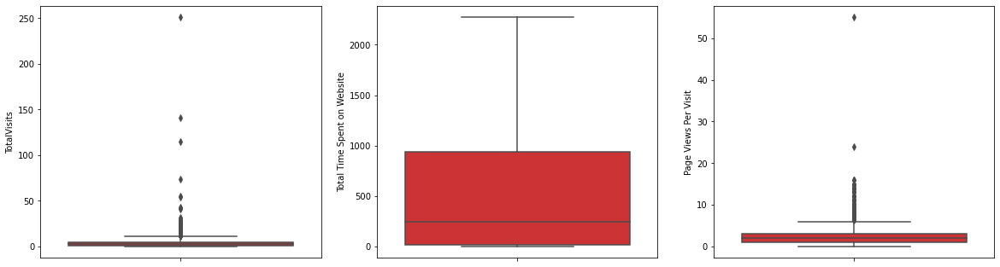

In [59]:
# Check the outliers in all the numeric columns

plt.figure(figsize=(20, 25))
plt.subplot(4,3,1)
sns.boxplot(y = 'TotalVisits', palette='Set1', data = lead)
plt.subplot(4,3,2)
sns.boxplot(y = 'Total Time Spent on Website', palette='Set1', data = lead)
plt.subplot(4,3,3)
sns.boxplot(y = 'Page Views Per Visit', palette='Set1', data = lead)
plt.show()

In [60]:
# Removing values beyond 99% for Total Visits

nn_quartile_total_visits = lead['TotalVisits'].quantile(0.99)
lead = lead[lead["TotalVisits"] < nn_quartile_total_visits]
lead["TotalVisits"].describe(percentiles=[.25,.5,.75,.90,.95,.99])

count    9141.000000
mean        3.179740
std         2.913631
min         0.000000
25%         1.000000
50%         3.000000
75%         5.000000
90%         7.000000
95%         9.000000
99%        13.000000
max        16.000000
Name: TotalVisits, dtype: float64

In [61]:
# Checking outliers at 25%,50%,75%,90%,95% and above

lead.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9141.00000,9141.000000,9141.000000,9141.000000,9141.000000
mean,617233.45192,0.385406,3.179740,486.074609,2.329506
std,23413.72193,0.486718,2.913631,547.856302,2.046673
min,579533.00000,0.000000,0.000000,0.000000,0.000000
25%,596519.00000,0.000000,1.000000,10.000000,1.000000
50%,615563.00000,0.000000,3.000000,247.000000,2.000000
75%,637414.00000,1.000000,5.000000,933.000000,3.000000
90%,650514.00000,1.000000,7.000000,1379.000000,5.000000
95%,655406.00000,1.000000,9.000000,1561.000000,6.000000
99%,659592.80000,1.000000,13.000000,1839.600000,9.000000


In [62]:
# Removing values beyond 99% for page Views Per Visit

nn_quartile_page_visits = lead['Page Views Per Visit'].quantile(0.99)
lead = lead[lead["Page Views Per Visit"] < nn_quartile_page_visits]
lead["Page Views Per Visit"].describe(percentiles=[.25,.5,.75,.90,.95,.99])

count    9029.000000
mean        2.226383
std         1.823395
min         0.000000
25%         1.000000
50%         2.000000
75%         3.000000
90%         5.000000
95%         6.000000
99%         7.000000
max         8.000000
Name: Page Views Per Visit, dtype: float64

In [63]:
# Checking data at 25%,50%,75%,90%,95% and above
lead.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9029.000000,9029.000000,9029.000000,9029.000000,9029.000000
mean,617223.248422,0.385092,3.087164,483.133016,2.226383
std,23372.383121,0.486644,2.801244,547.420675,1.823395
min,579533.000000,0.000000,0.000000,0.000000,0.000000
25%,596530.000000,0.000000,1.000000,7.000000,1.000000
50%,615645.000000,0.000000,3.000000,245.000000,2.000000
75%,637360.000000,1.000000,4.000000,929.000000,3.000000
90%,650463.200000,1.000000,7.000000,1378.000000,5.000000
95%,655351.600000,1.000000,8.000000,1558.000000,6.000000
99%,659577.800000,1.000000,13.000000,1839.720000,7.000000


In [64]:
# Determine the percentage of data retained

num_data = round(100*(len(lead)/len(lead_copy)),2)
print(num_data)

97.72


**At this point, the data has been cleaned and around 98% of data has been retained.**

# 📊 Exploratory Data Analysis

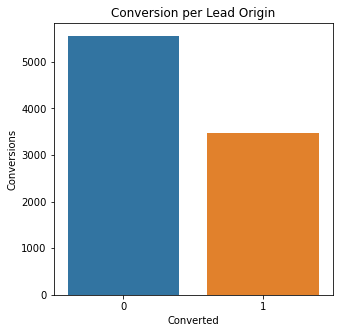

In [65]:
fig , ax = plt.subplots(figsize=(5,5))
ax = sns.countplot(lead["Converted"])
# Adding some communication
plt.title("Conversion per Lead Origin")
plt.ylabel("Conversions")
plt.xticks(rotation = 0);

In [66]:
lead['Converted'].value_counts(normalize=True)*100

0    61.490752
1    38.509248
Name: Converted, dtype: float64

**From the current dataset it can be very well said that the current convertion rate is 38.5%.**

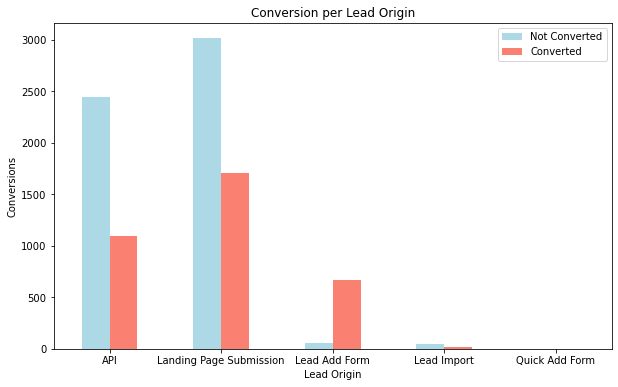

In [67]:
pd.crosstab(lead['Lead Origin'], lead["Converted"]).plot(kind = "bar",
                                         figsize = (10, 6),
                                         color = ["lightblue", "salmon"])
# Adding some communication
plt.title("Conversion per Lead Origin")
plt.xlabel("Lead Origin")
plt.ylabel("Conversions")
plt.legend(["Not Converted", "Converted"])
plt.xticks(rotation = 0);

**Inference: The Lead Origin- Landing Page Submission has the highest conversion rate among others.**

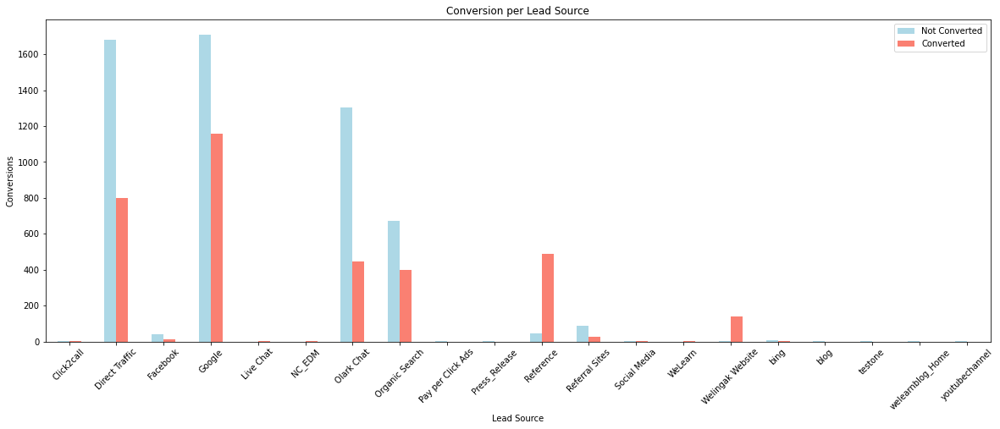

In [68]:
pd.crosstab(lead['Lead Source'], lead["Converted"]).plot(kind = "bar",
                                         figsize = (20, 7),
                                         color = ["lightblue", "salmon"])
# Adding some communication
plt.title("Conversion per Lead Source")
plt.xlabel("Lead Source")
plt.ylabel("Conversions")
plt.legend(["Not Converted", "Converted"])
plt.xticks(rotation = 45);

**Inference: Coversion Per Lead Origin: Google has the highest conversion rate.**

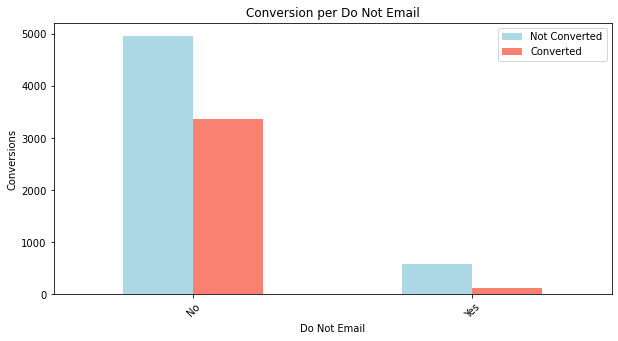

In [69]:
pd.crosstab(lead['Do Not Email'], lead["Converted"]).plot(kind = "bar",
                                         figsize = (10, 5),
                                         color = ["lightblue", "salmon"])
# Adding some communication
plt.title("Conversion per Do Not Email")
plt.xlabel("Do Not Email")
plt.ylabel("Conversions")
plt.legend(["Not Converted", "Converted"])
plt.xticks(rotation = 45);

**Inference: Leads who recieved Emails had a higher conversion rate.**

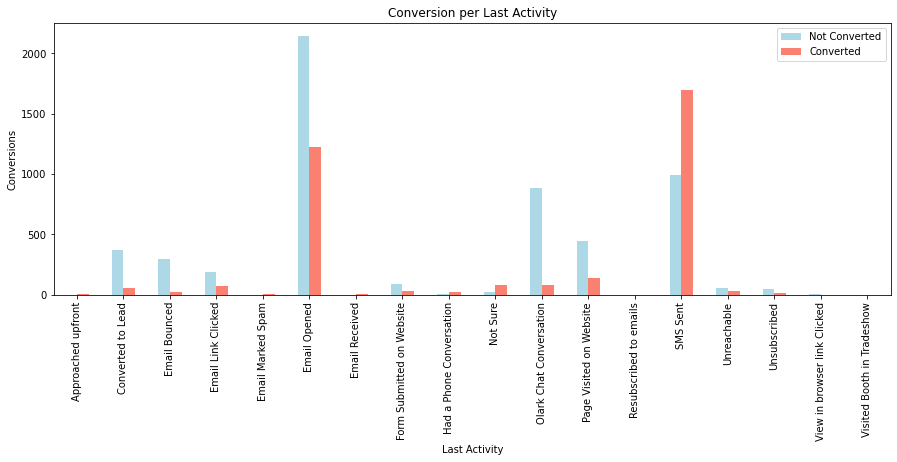

In [70]:
pd.crosstab(lead['Last Activity'], lead["Converted"]).plot(kind = "bar",
                                         figsize = (15, 5),
                                         color = ["lightblue", "salmon"])
# Adding some communication
plt.title("Conversion per Last Activity")
plt.xlabel("Last Activity")
plt.ylabel("Conversions")
plt.legend(["Not Converted", "Converted"])
plt.xticks(rotation = 90);

**Inference: Leads whose Last Activity was SMS sent had the best conversion rate.**

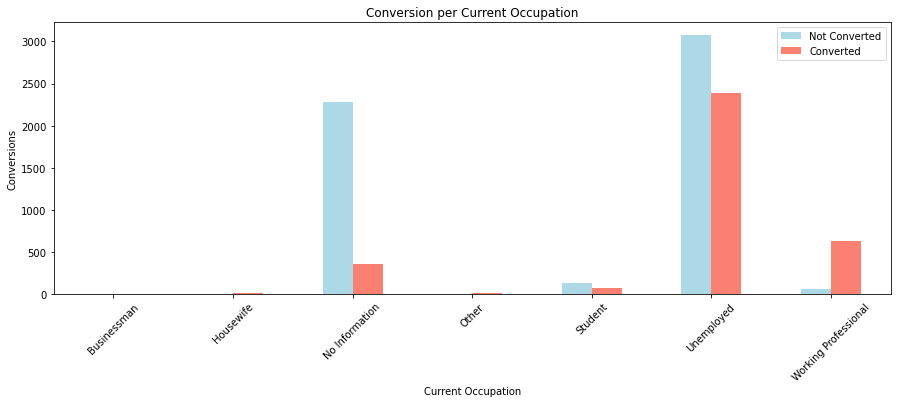

In [71]:
pd.crosstab(lead['What is your current occupation'], lead["Converted"]).plot(kind = "bar",
                                         figsize = (15, 5),
                                         color = ["lightblue", "salmon"])
# Adding some communication
plt.title("Conversion per Current Occupation")
plt.xlabel("Current Occupation")
plt.ylabel("Conversions")
plt.legend(["Not Converted", "Converted"])
plt.xticks(rotation = 45);

**Inference: Leads who are Unemployed had the best conversion rate followed by Working Professionals.**

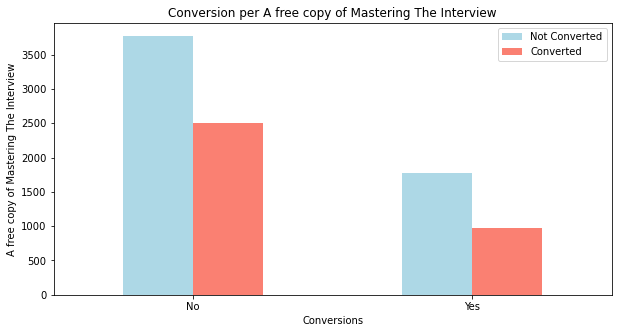

In [72]:
pd.crosstab(lead['A free copy of Mastering The Interview'], lead["Converted"]).plot(kind = "bar",
                                         figsize = (10, 5),
                                         color = ["lightblue", "salmon"])
# Adding some communication
plt.title("Conversion per A free copy of Mastering The Interview")
plt.xlabel("Conversions")
plt.ylabel("A free copy of Mastering The Interview")
plt.legend(["Not Converted", "Converted"])
plt.xticks(rotation = 0);

**Inference: It can be very well observed that people who did not want a free copy of Mastering The Interview had a higher conversion rate as compared to the one who did.**

In [73]:
lead['Last Notable Activity'].value_counts()

Modified                        3344
Email Opened                    2770
SMS Sent                        2126
Page Visited on Website          281
Olark Chat Conversation          182
Email Link Clicked               170
Email Bounced                     59
Unsubscribed                      46
Unreachable                       31
Had a Phone Conversation          13
Email Marked Spam                  2
Approached upfront                 1
Resubscribed to emails             1
View in browser link Clicked       1
Form Submitted on Website          1
Email Received                     1
Name: Last Notable Activity, dtype: int64

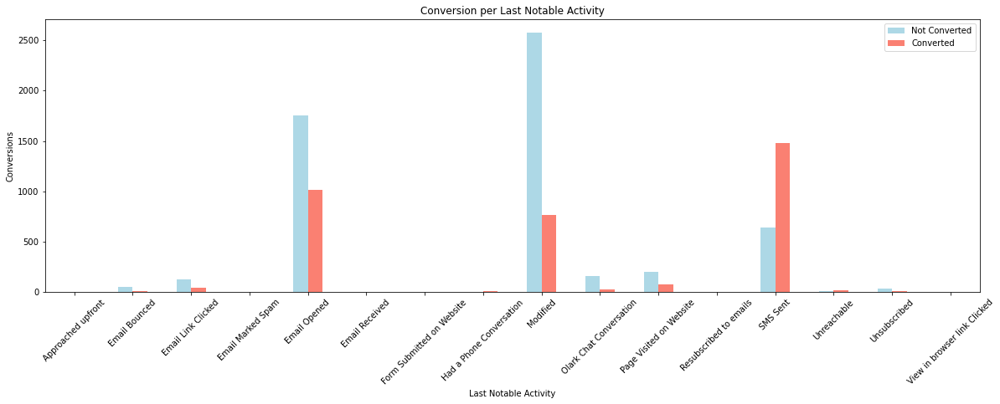

In [74]:
pd.crosstab(lead['Last Notable Activity'], lead["Converted"]).plot(kind = "bar",
                                         figsize = (20, 6),
                                         color = ["lightblue", "salmon"])
# Adding some communication
plt.title("Conversion per Last Notable Activity")
plt.xlabel("Last Notable Activity")
plt.ylabel("Conversions")
plt.legend(["Not Converted", "Converted"])
plt.xticks(rotation = 45);

**Inference: Students whose Last Notable Activity was found to be SMS Sent had the best conversion rate.**

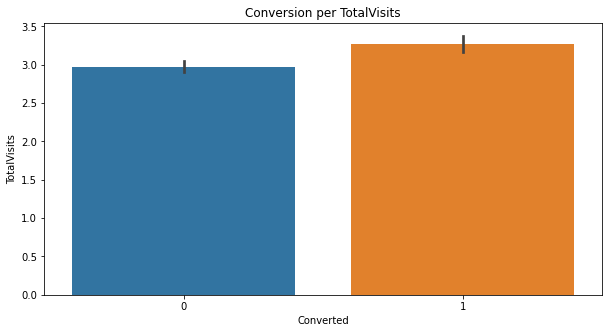

In [75]:
plt.figure(figsize=(10,5))
plt.title("Conversion per TotalVisits")
sns.barplot(y = 'TotalVisits', x='Converted', data = lead)
plt.show()



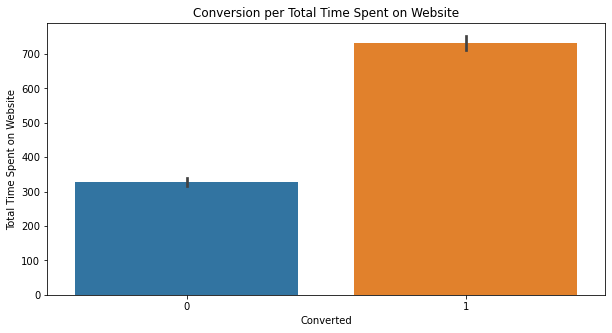

In [76]:
plt.figure(figsize=(10,5))
plt.title("Conversion per Total Time Spent on Website")
sns.barplot(y = 'Total Time Spent on Website', x='Converted', data = lead)
plt.show()

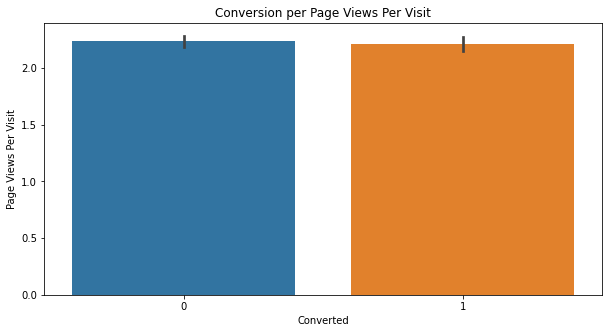

In [77]:
plt.figure(figsize=(10,5))
plt.title("Conversion per Page Views Per Visit")
sns.barplot(y = 'Page Views Per Visit', x='Converted', data = lead)
plt.show()

In [78]:
variable =  ['Do Not Email', 'A free copy of Mastering The Interview']

# Defining the map function
def binary_map(x):
    return x.map({'Yes': 1, "No": 0})

# Applying the function to the columns
lead[variable] = lead[variable].apply(binary_map)

**Creating dummy variables and dropping the categories with nominal number of records as compared to others.**

In [79]:
# Creating dummies for the following columns below

# Lead Origin : 

lead_origin = pd.get_dummies(lead['Lead Origin'], prefix='LeadOrigin')
# Dropping quick Add Form column
lead_origin1 = lead_origin.drop(['LeadOrigin_Quick Add Form'], 1)
#Adding the results to the master dataframe
lead = pd.concat([lead, lead_origin1], axis = 1)

# Lead Source :

lead_source = pd.get_dummies(lead['Lead Source'], prefix='LeadSource')
# Dropping blog column
lead_source1 = lead_source.drop(['LeadSource_NC_EDM'], 1)
# Adding the results to the master dataframe
lead = pd.concat([lead,lead_source1], axis=1)

# last Activity

last_activity = pd.get_dummies(lead['Last Activity'], prefix='LastActivity')
# Dropping Resubscribed to emails column
last_activity1 = last_activity.drop(['LastActivity_Resubscribed to emails'], 1)
# Adding the results to the master dataframe
lead = pd.concat([lead,last_activity1], axis=1)

# What is your current occupation

curr_occupation = pd.get_dummies(lead['What is your current occupation'], prefix='CurrentOccupation')
# Dropping No Information column
curr_occupation1 = curr_occupation.drop(['CurrentOccupation_Businessman'], 1)
# Adding the results to the master dataframe
lead = pd.concat([lead,curr_occupation1], axis=1)

# Last Notable Activity

last_notable_activity = pd.get_dummies(lead['Last Notable Activity'], prefix='LastNotableActivity')
# Dropping Resubscribed to emails column
last_notable_activity1 = last_notable_activity.drop(['LastNotableActivity_Resubscribed to emails'], 1)
# Adding the results to the master dataframe
lead = pd.concat([lead,last_notable_activity1], axis=1)

lead.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,...,LastNotableActivity_Email Received,LastNotableActivity_Form Submitted on Website,LastNotableActivity_Had a Phone Conversation,LastNotableActivity_Modified,LastNotableActivity_Olark Chat Conversation,LastNotableActivity_Page Visited on Website,LastNotableActivity_SMS Sent,LastNotableActivity_Unreachable,LastNotableActivity_Unsubscribed,LastNotableActivity_View in browser link Clicked
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,0,0,0.0,0,0.0,Page Visited on Website,...,0,0,0,1,0,0,0,0,0,0
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,0,0,5.0,674,2.5,Email Opened,...,0,0,0,0,0,0,0,0,0,0
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Email Opened,...,0,0,0,0,0,0,0,0,0,0
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,0,0,1.0,305,1.0,Unreachable,...,0,0,0,1,0,0,0,0,0,0
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,0,1,2.0,1428,1.0,Converted to Lead,...,0,0,0,1,0,0,0,0,0,0


### Now that we have made dummy variables, the next step is to remove the original attributes along with the columns which do not hold explanatory power.

In [80]:
lead.drop(['Prospect ID','Lead Number', 'Lead Origin', 'Lead Source', 'Last Activity',
           'What is your current occupation', 'Last Notable Activity'], 
           axis=1, inplace = True)

In [81]:
# Let's take a look at the final preprocessed dataframe
lead.shape

(9029, 67)

In [82]:
lead.isnull().sum()

Do Not Email                                        0
Converted                                           0
TotalVisits                                         0
Total Time Spent on Website                         0
Page Views Per Visit                                0
                                                   ..
LastNotableActivity_Page Visited on Website         0
LastNotableActivity_SMS Sent                        0
LastNotableActivity_Unreachable                     0
LastNotableActivity_Unsubscribed                    0
LastNotableActivity_View in browser link Clicked    0
Length: 67, dtype: int64

## Train-Test Split

In [83]:
from sklearn.model_selection import train_test_split

In [84]:
X = lead.drop(['Converted'], axis = 1)
X.head()

,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,LeadOrigin_API,LeadOrigin_Landing Page Submission,LeadOrigin_Lead Add Form,LeadOrigin_Lead Import,LeadSource_Click2call,...,LastNotableActivity_Email Received,LastNotableActivity_Form Submitted on Website,LastNotableActivity_Had a Phone Conversation,LastNotableActivity_Modified,LastNotableActivity_Olark Chat Conversation,LastNotableActivity_Page Visited on Website,LastNotableActivity_SMS Sent,LastNotableActivity_Unreachable,LastNotableActivity_Unsubscribed,LastNotableActivity_View in browser link Clicked
0,0,0.0,0,0.0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
1,0,5.0,674,2.5,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,2.0,1532,2.0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1.0,305,1.0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,2.0,1428,1.0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [85]:
y = lead['Converted']
y.head()

0    0
1    0
2    1
3    0
4    1
Name: Converted, dtype: int64

In [86]:
# Splitting the data in train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state=0)

In [87]:
X_train.shape, y_train.shape

((6771, 66), (6771,))

In [88]:
X_test.shape, y_test.shape

((2258, 66), (2258,))

## Feature Scaling using MinMax Scaling

In [89]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']] = scaler.fit_transform(X_train[['TotalVisits',
                                                                                                              'Total Time Spent on Website',
                                                                                                              'Page Views Per Visit']])
X_train.head()

,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,LeadOrigin_API,LeadOrigin_Landing Page Submission,LeadOrigin_Lead Add Form,LeadOrigin_Lead Import,LeadSource_Click2call,...,LastNotableActivity_Email Received,LastNotableActivity_Form Submitted on Website,LastNotableActivity_Had a Phone Conversation,LastNotableActivity_Modified,LastNotableActivity_Olark Chat Conversation,LastNotableActivity_Page Visited on Website,LastNotableActivity_SMS Sent,LastNotableActivity_Unreachable,LastNotableActivity_Unsubscribed,LastNotableActivity_View in browser link Clicked
6095,0,0.2500,0.783011,0.5000,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8989,0,0.0000,0.000000,0.0000,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7262,1,0.3125,0.235475,0.3125,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2399,1,0.2500,0.639085,0.5000,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8990,0,0.1250,0.627201,0.2500,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0


### Now that the features have been scaled and we've got the required dummy variables, we are good to proceed with building our first model.

In [90]:
import statsmodels.api as sm

In [91]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6708
Model Family:                Binomial   Df Model:                           62
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 03 Apr 2022   Deviance:                          nan
Time:                        15:54:46   Pearson chi2:                 1.15e+19
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
====================================================================================================================
                                                       coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------
const                                             1.774e+16   8.81e+07   2.01e+08      0.000    1.77e+16    1.77e+16
Do Not Email                                     -3.548e+14   4.41e+06  -8.05e+07      0.000   -3.55e+14   -3.55e+14
TotalVisits                                      -5.868e+14   5.54e+06  -1.06e+08      0.000   -5.87e+14   -5.87e+14
Total Time Spent on Website                      -8.863e+14   3.42e+06  -2.59e+08      0.000   -8.86e+14   -8.86e+14
Page Views Per Visit                              1.003e+15   5.27e+06    1.9e+08      0.000       1e+15       1e+15
A free copy of Mastering The Interview           -4.586e+13    2.5e+06  -1.83e+07      0.000   -4.59e+13   -4.59e+13
LeadOrigin_API                                   -1.122e+16   6.73e+07  -1.67e+08      0.000   -1.12e+16   -1.12e+16
LeadOrigin_Landing Page Submission               -1.159e+16   6.74e+07  -1.72e+08      0.000   -1.16e+16   -1.16e+16
LeadOrigin_Lead Add Form                         -1.113e+16   6.85e+07  -1.62e+08      0.000   -1.11e+16   -1.11e+16
LeadOrigin_Lead Import                           -1.101e+16   8.26e+07  -1.33e+08      0.000    -1.1e+16    -1.1e+16
LeadSource_Click2call                            -1.477e+16   9.58e+07  -1.54e+08      0.000   -1.48e+16   -1.48e+16
LeadSource_Direct Traffic                        -9.204e+15   6.72e+07  -1.37e+08      0.000    -9.2e+15    -9.2e+15
LeadSource_Facebook                               -1.19e+16   8.25e+07  -1.44e+08      0.000   -1.19e+16   -1.19e+16
LeadSource_Google                                -9.304e+15   6.72e+07  -1.39e+08      0.000    -9.3e+15    -9.3e+15
LeadSource_Live Chat                             -1.821e+15   9.58e+07   -1.9e+07      0.000   -1.82e+15   -1.82e+15
LeadSource_Olark Chat                             -8.57e+15   6.72e+07  -1.27e+08      0.000   -8.57e+15   -8.57e+15
LeadSource_Organic Search                        -9.248e+15   6.72e+07  -1.38e+08      0.000   -9.25e+15   -9.25e+15
LeadSource_Pay per Click Ads                      -1.42e+16    9.5e+07   -1.5e+08      0.000   -1.42e+16   -1.42e+16
LeadSource_Press_Release                         -1.524e+16   9.52e+07   -1.6e+08      0.000   -1.52e+16   -1.52e+16
LeadSource_Reference                             -9.169e+15   6.84e+07  -1.34e+08      0.000   -9.17e+15   -9.17e+15
LeadSource_Referral Sites                        -9.569e+15   6.76e+07  -1.42e+08      0.000   -9.57e+15   -9.57e+15
LeadSource_Social Media                          -8.502e+15   8.23e+07  -1.03e+08      0.000    -8.5e+15    -8.5e+15
LeadSource_WeLearn                               -1.372e+15   9.49e+07  -1.45e+07      0.000   -1.37e+15   -1.37e+15
LeadSource_Welingak Website              

## Feature Selection Using RFE

In [92]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

In [93]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 25)             # running RFE with 25 variables as output
rfe = rfe.fit(X_train, y_train)

In [94]:
rfe.support_

array([ True,  True,  True,  True, False, False, False,  True, False,
       False, False, False, False, False,  True, False, False, False,
        True, False,  True, False,  True, False, False, False, False,
       False,  True, False, False, False, False,  True, False, False,
       False, False,  True, False,  True, False,  True, False, False,
        True,  True, False, False,  True,  True, False, False,  True,
       False,  True, False, False,  True,  True,  True,  True, False,
        True, False, False])

In [95]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('Do Not Email', True, 1),
 ('TotalVisits', True, 1),
 ('Total Time Spent on Website', True, 1),
 ('Page Views Per Visit', True, 1),
 ('A free copy of Mastering The Interview', False, 33),
 ('LeadOrigin_API', False, 5),
 ('LeadOrigin_Landing Page Submission', False, 4),
 ('LeadOrigin_Lead Add Form', True, 1),
 ('LeadOrigin_Lead Import', False, 22),
 ('LeadSource_Click2call', False, 3),
 ('LeadSource_Direct Traffic', False, 12),
 ('LeadSource_Facebook', False, 11),
 ('LeadSource_Google', False, 15),
 ('LeadSource_Live Chat', False, 35),
 ('LeadSource_Olark Chat', True, 1),
 ('LeadSource_Organic Search', False, 13),
 ('LeadSource_Pay per Click Ads', False, 25),
 ('LeadSource_Press_Release', False, 38),
 ('LeadSource_Reference', True, 1),
 ('LeadSource_Referral Sites', False, 14),
 ('LeadSource_Social Media', True, 1),
 ('LeadSource_WeLearn', False, 21),
 ('LeadSource_Welingak Website', True, 1),
 ('LeadSource_bing', False, 39),
 ('LeadSource_blog', False, 27),
 ('LeadSource_testone', Fa

In [96]:
# Attributes selected by RFE
col = X_train.columns[rfe.support_]
col

Index(['Do Not Email', 'TotalVisits', 'Total Time Spent on Website',
       'Page Views Per Visit', 'LeadOrigin_Lead Add Form',
       'LeadSource_Olark Chat', 'LeadSource_Reference',
       'LeadSource_Social Media', 'LeadSource_Welingak Website',
       'LastActivity_Approached upfront', 'LastActivity_Email Opened',
       'LastActivity_Olark Chat Conversation', 'LastActivity_SMS Sent',
       'LastActivity_Unsubscribed', 'CurrentOccupation_Housewife',
       'CurrentOccupation_No Information', 'CurrentOccupation_Unemployed',
       'CurrentOccupation_Working Professional',
       'LastNotableActivity_Email Link Clicked',
       'LastNotableActivity_Email Opened',
       'LastNotableActivity_Had a Phone Conversation',
       'LastNotableActivity_Modified',
       'LastNotableActivity_Olark Chat Conversation',
       'LastNotableActivity_Page Visited on Website',
       'LastNotableActivity_Unreachable'],
      dtype='object')

In [97]:
# Attributes rejected by RFE
X_train.columns[~rfe.support_]

Index(['A free copy of Mastering The Interview', 'LeadOrigin_API',
       'LeadOrigin_Landing Page Submission', 'LeadOrigin_Lead Import',
       'LeadSource_Click2call', 'LeadSource_Direct Traffic',
       'LeadSource_Facebook', 'LeadSource_Google', 'LeadSource_Live Chat',
       'LeadSource_Organic Search', 'LeadSource_Pay per Click Ads',
       'LeadSource_Press_Release', 'LeadSource_Referral Sites',
       'LeadSource_WeLearn', 'LeadSource_bing', 'LeadSource_blog',
       'LeadSource_testone', 'LeadSource_welearnblog_Home',
       'LeadSource_youtubechannel', 'LastActivity_Converted to Lead',
       'LastActivity_Email Bounced', 'LastActivity_Email Link Clicked',
       'LastActivity_Email Marked Spam', 'LastActivity_Email Received',
       'LastActivity_Form Submitted on Website',
       'LastActivity_Had a Phone Conversation', 'LastActivity_Not Sure',
       'LastActivity_Page Visited on Website', 'LastActivity_Unreachable',
       'LastActivity_View in browser link Clicked',
    

##### Assessing the model with StatsModels

In [98]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6745
Model Family:                Binomial   Df Model:                           25
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2715.8
Date:                Sun, 03 Apr 2022   Deviance:                       5431.7
Time:                        15:54:51   Pearson chi2:                 6.85e+03
No. Iterations:                    22                                         
Covariance Type:            nonrobust                                         
================================================================================================================
                                                   coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------
const                                           -1.6150      0.270     -5.975      0.000      -2.145      -1.085
Do Not Email                                    -1.3747      0.181     -7.580      0.000      -1.730      -1.019
TotalVisits                                      1.4311      0.281      5.100      0.000       0.881       1.981
Total Time Spent on Website                      4.5435      0.165     27.616      0.000       4.221       4.866
Page Views Per Visit                            -0.9585      0.241     -3.981      0.000      -1.430      -0.487
LeadOrigin_Lead Add Form                         2.7114      0.475      5.713      0.000       1.781       3.642
LeadSource_Olark Chat                            1.3516      0.127     10.663      0.000       1.103       1.600
LeadSource_Reference                             0.9376      0.507      1.848      0.065      -0.057       1.932
LeadSource_Social Media                          2.1140      1.463      1.445      0.149      -0.754       4.982
LeadSource_Welingak Website                      3.6000      1.110      3.243      0.001       1.424       5.776
LastActivity_Approached upfront                 23.7143   2.47e+04      0.001      0.999   -4.83e+04    4.84e+04
LastActivity_Email Opened                        0.7490      0.165      4.530      0.000       0.425       1.073
LastActivity_Olark Chat Conversation            -0.5803      0.202     -2.869      0.004      -0.977      -0.184
LastActivity_SMS Sent                            1.1933      0.161      7.429      0.000       0.878       1.508
LastActivity_Unsubscribed                        1.1019      0.458      2.408      0.016       0.205       1.999
CurrentOccupation_Housewife                     23.7331   2.56e+04      0.001      0.999   -5.02e+04    5.02e+04
CurrentOccupation_No Information                -1.3161      0.208     -6.334      0.000      -1.723      -0.909
CurrentOccupation_Unemployed                    -0.1177      0.197     -0.597      0.550      -0.504       0.268
CurrentOccupation_Working Professional           2.2081      0.257      8.595      0.000       1.705       2.712
LastNotableActivity_Email Link Clicked          -0.7021      0.310     -2.267      0.023      -1.309      -0.095
LastNotableActivity_Email Opened                -0.9824      0.196     -5.012      0.000      -1.367      -0.598
LastNotableActivity_Had a Phone Conversation     2.2353      1.279      1.748      0.080      -0.271       4.742
LastNotableActivity_Modified                    -1.1212      0.140     -7.982      0.000      -1.396      -0.846
LastNotableActivity_Olark Chat Conversation     -0.9373      0.389     -2.412      0.016      -1.699      -0.176
LastNotableActivity_Page Visited

**Dropping LastActivity_Approached upfront becuase of its insignificance.**

In [99]:
col = col.drop('LastActivity_Approached upfront')

**Building another model**

In [100]:
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6746
Model Family:                Binomial   Df Model:                           24
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2721.2
Date:                Sun, 03 Apr 2022   Deviance:                       5442.3
Time:                        15:54:51   Pearson chi2:                 6.86e+03
No. Iterations:                    21                                         
Covariance Type:            nonrobust                                         
================================================================================================================
                                                   coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------
const                                           -1.5972      0.270     -5.917      0.000      -2.126      -1.068
Do Not Email                                    -1.3886      0.181     -7.664      0.000      -1.744      -1.033
TotalVisits                                      1.4301      0.281      5.098      0.000       0.880       1.980
Total Time Spent on Website                      4.5479      0.164     27.658      0.000       4.226       4.870
Page Views Per Visit                            -0.9452      0.241     -3.929      0.000      -1.417      -0.474
LeadOrigin_Lead Add Form                         2.7132      0.474      5.719      0.000       1.783       3.643
LeadSource_Olark Chat                            1.3696      0.127     10.815      0.000       1.121       1.618
LeadSource_Reference                             0.9486      0.507      1.871      0.061      -0.045       1.942
LeadSource_Social Media                          2.1006      1.460      1.439      0.150      -0.760       4.962
LeadSource_Welingak Website                      3.6012      1.110      3.245      0.001       1.426       5.777
LastActivity_Email Opened                        0.7130      0.165      4.334      0.000       0.391       1.035
LastActivity_Olark Chat Conversation            -0.6206      0.202     -3.079      0.002      -1.016      -0.226
LastActivity_SMS Sent                            1.1618      0.160      7.266      0.000       0.848       1.475
LastActivity_Unsubscribed                        1.0838      0.457      2.370      0.018       0.187       1.980
CurrentOccupation_Housewife                     22.7297   1.55e+04      0.001      0.999   -3.04e+04    3.04e+04
CurrentOccupation_No Information                -1.3140      0.208     -6.326      0.000      -1.721      -0.907
CurrentOccupation_Unemployed                    -0.1105      0.197     -0.561      0.575      -0.497       0.275
CurrentOccupation_Working Professional           2.2088      0.257      8.600      0.000       1.705       2.712
LastNotableActivity_Email Link Clicked          -0.7355      0.309     -2.378      0.017      -1.342      -0.129
LastNotableActivity_Email Opened                -0.9787      0.196     -4.993      0.000      -1.363      -0.594
LastNotableActivity_Had a Phone Conversation     2.2065      1.280      1.724      0.085      -0.302       4.715
LastNotableActivity_Modified                    -1.1176      0.140     -7.958      0.000      -1.393      -0.842
LastNotableActivity_Olark Chat Conversation     -0.9332      0.389     -2.402      0.016      -1.695      -0.172
LastNotableActivity_Page Visited on Website     -0.6539      0.266     -2.459      0.014      -1.175      -0.133
LastNotableActivity_Unreachable 

**Dropping CurrentOccupation_Housewife because of its significance.**

In [101]:
col = col.drop('CurrentOccupation_Housewife')

**Building another model**

In [102]:
X_train_sm = sm.add_constant(X_train[col])
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6747
Model Family:                Binomial   Df Model:                           23
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2726.0
Date:                Sun, 03 Apr 2022   Deviance:                       5452.0
Time:                        15:54:51   Pearson chi2:                 6.86e+03
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
================================================================================================================
                                                   coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------
const                                           -1.4869      0.266     -5.590      0.000      -2.008      -0.966
Do Not Email                                    -1.3924      0.181     -7.690      0.000      -1.747      -1.038
TotalVisits                                      1.4255      0.280      5.085      0.000       0.876       1.975
Total Time Spent on Website                      4.5453      0.164     27.673      0.000       4.223       4.867
Page Views Per Visit                            -0.9498      0.240     -3.951      0.000      -1.421      -0.479
LeadOrigin_Lead Add Form                         2.7086      0.475      5.708      0.000       1.779       3.639
LeadSource_Olark Chat                            1.3613      0.126     10.762      0.000       1.113       1.609
LeadSource_Reference                             0.9505      0.507      1.874      0.061      -0.043       1.945
LeadSource_Social Media                          2.0983      1.459      1.438      0.150      -0.761       4.958
LeadSource_Welingak Website                      3.6017      1.110      3.245      0.001       1.426       5.777
LastActivity_Email Opened                        0.7073      0.164      4.307      0.000       0.385       1.029
LastActivity_Olark Chat Conversation            -0.6281      0.201     -3.119      0.002      -1.023      -0.233
LastActivity_SMS Sent                            1.1560      0.160      7.238      0.000       0.843       1.469
LastActivity_Unsubscribed                        1.0814      0.457      2.366      0.018       0.186       1.977
CurrentOccupation_No Information                -1.4144      0.203     -6.957      0.000      -1.813      -1.016
CurrentOccupation_Unemployed                    -0.2119      0.192     -1.102      0.270      -0.589       0.165
CurrentOccupation_Working Professional           2.1065      0.253      8.321      0.000       1.610       2.603
LastNotableActivity_Email Link Clicked          -0.7420      0.309     -2.399      0.016      -1.348      -0.136
LastNotableActivity_Email Opened                -0.9757      0.196     -4.980      0.000      -1.360      -0.592
LastNotableActivity_Had a Phone Conversation     2.2008      1.279      1.720      0.085      -0.306       4.708
LastNotableActivity_Modified                    -1.1177      0.140     -7.959      0.000      -1.393      -0.842
LastNotableActivity_Olark Chat Conversation     -0.9329      0.389     -2.400      0.016      -1.695      -0.171
LastNotableActivity_Page Visited on Website     -0.6625      0.266     -2.493      0.013      -1.183      -0.142
LastNotableActivity_Unreachable                  1.8081      0.608      2.973      0.003       0.616       3.000
================================

**Dropping CurrentOccupation_Unemployed	 becuase of its insignificance.**

In [103]:
col = col.drop('CurrentOccupation_Unemployed')

**Building another model**

In [104]:
X_train_sm = sm.add_constant(X_train[col])
logm5 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm5.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6748
Model Family:                Binomial   Df Model:                           22
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2726.6
Date:                Sun, 03 Apr 2022   Deviance:                       5453.2
Time:                        15:54:51   Pearson chi2:                 6.87e+03
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
================================================================================================================
                                                   coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------
const                                           -1.6904      0.192     -8.807      0.000      -2.067      -1.314
Do Not Email                                    -1.3925      0.181     -7.685      0.000      -1.748      -1.037
TotalVisits                                      1.4240      0.280      5.080      0.000       0.875       1.973
Total Time Spent on Website                      4.5478      0.164     27.689      0.000       4.226       4.870
Page Views Per Visit                            -0.9499      0.240     -3.952      0.000      -1.421      -0.479
LeadOrigin_Lead Add Form                         2.7055      0.474      5.707      0.000       1.776       3.635
LeadSource_Olark Chat                            1.3645      0.126     10.789      0.000       1.117       1.612
LeadSource_Reference                             0.9625      0.507      1.900      0.057      -0.031       1.956
LeadSource_Social Media                          2.0871      1.459      1.430      0.153      -0.773       4.947
LeadSource_Welingak Website                      3.5973      1.110      3.241      0.001       1.422       5.772
LastActivity_Email Opened                        0.7055      0.164      4.297      0.000       0.384       1.027
LastActivity_Olark Chat Conversation            -0.6270      0.201     -3.114      0.002      -1.022      -0.232
LastActivity_SMS Sent                            1.1515      0.160      7.213      0.000       0.839       1.464
LastActivity_Unsubscribed                        1.0779      0.457      2.357      0.018       0.182       1.974
CurrentOccupation_No Information                -1.2118      0.087    -13.907      0.000      -1.383      -1.041
CurrentOccupation_Working Professional           2.3089      0.174     13.233      0.000       1.967       2.651
LastNotableActivity_Email Link Clicked          -0.7438      0.309     -2.404      0.016      -1.350      -0.137
LastNotableActivity_Email Opened                -0.9722      0.196     -4.963      0.000      -1.356      -0.588
LastNotableActivity_Had a Phone Conversation     2.1960      1.280      1.715      0.086      -0.314       4.706
LastNotableActivity_Modified                    -1.1158      0.140     -7.946      0.000      -1.391      -0.841
LastNotableActivity_Olark Chat Conversation     -0.9297      0.388     -2.394      0.017      -1.691      -0.168
LastNotableActivity_Page Visited on Website     -0.6591      0.266     -2.480      0.013      -1.180      -0.138
LastNotableActivity_Unreachable                  1.8034      0.608      2.964      0.003       0.611       2.996
================================================================================================================
"""

**Dropping LeadSource_Social Media because of its insginificance.**

In [105]:
col =col.drop('LeadSource_Social Media')

**Building another model**

In [106]:
X_train_sm = sm.add_constant(X_train[col])
logm6 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm6.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6749
Model Family:                Binomial   Df Model:                           21
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2727.5
Date:                Sun, 03 Apr 2022   Deviance:                       5455.0
Time:                        15:54:51   Pearson chi2:                 6.87e+03
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
================================================================================================================
                                                   coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------
const                                           -1.6856      0.192     -8.785      0.000      -2.062      -1.310
Do Not Email                                    -1.3938      0.181     -7.694      0.000      -1.749      -1.039
TotalVisits                                      1.4197      0.280      5.066      0.000       0.870       1.969
Total Time Spent on Website                      4.5465      0.164     27.684      0.000       4.225       4.868
Page Views Per Visit                            -0.9493      0.240     -3.950      0.000      -1.420      -0.478
LeadOrigin_Lead Add Form                         2.7035      0.474      5.703      0.000       1.774       3.633
LeadSource_Olark Chat                            1.3607      0.126     10.765      0.000       1.113       1.608
LeadSource_Reference                             0.9619      0.507      1.899      0.058      -0.031       1.955
LeadSource_Welingak Website                      3.5969      1.110      3.241      0.001       1.422       5.772
LastActivity_Email Opened                        0.7025      0.164      4.279      0.000       0.381       1.024
LastActivity_Olark Chat Conversation            -0.6168      0.201     -3.069      0.002      -1.011      -0.223
LastActivity_SMS Sent                            1.1485      0.160      7.196      0.000       0.836       1.461
LastActivity_Unsubscribed                        1.0762      0.457      2.354      0.019       0.180       1.972
CurrentOccupation_No Information                -1.2129      0.087    -13.924      0.000      -1.384      -1.042
CurrentOccupation_Working Professional           2.3071      0.174     13.227      0.000       1.965       2.649
LastNotableActivity_Email Link Clicked          -0.7459      0.309     -2.411      0.016      -1.352      -0.140
LastNotableActivity_Email Opened                -0.9719      0.196     -4.962      0.000      -1.356      -0.588
LastNotableActivity_Had a Phone Conversation     2.1928      1.280      1.713      0.087      -0.317       4.702
LastNotableActivity_Modified                    -1.1154      0.140     -7.944      0.000      -1.391      -0.840
LastNotableActivity_Olark Chat Conversation     -0.9409      0.388     -2.424      0.015      -1.702      -0.180
LastNotableActivity_Page Visited on Website     -0.6613      0.266     -2.489      0.013      -1.182      -0.141
LastNotableActivity_Unreachable                  1.8004      0.608      2.959      0.003       0.608       2.993
================================================================================================================
"""

**Dropping LastNotableActivity_Had a Phone Conversation becuase of its insignificance.**

In [107]:
col = col.drop('LastNotableActivity_Had a Phone Conversation')

**Building another model**

In [108]:
X_train_sm = sm.add_constant(X_train[col])
logm7 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm7.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6750
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2729.4
Date:                Sun, 03 Apr 2022   Deviance:                       5458.8
Time:                        15:54:51   Pearson chi2:                 6.87e+03
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
===============================================================================================================
                                                  coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------
const                                          -1.6309      0.189     -8.616      0.000      -2.002      -1.260
Do Not Email                                   -1.4085      0.181     -7.782      0.000      -1.763      -1.054
TotalVisits                                     1.4246      0.280      5.089      0.000       0.876       1.973
Total Time Spent on Website                     4.5474      0.164     27.700      0.000       4.226       4.869
Page Views Per Visit                           -0.9472      0.240     -3.943      0.000      -1.418      -0.476
LeadOrigin_Lead Add Form                        2.7045      0.474      5.705      0.000       1.775       3.634
LeadSource_Olark Chat                           1.3605      0.126     10.767      0.000       1.113       1.608
LeadSource_Reference                            0.9621      0.507      1.899      0.058      -0.031       1.955
LeadSource_Welingak Website                     3.5994      1.110      3.243      0.001       1.424       5.775
LastActivity_Email Opened                       0.6825      0.164      4.172      0.000       0.362       1.003
LastActivity_Olark Chat Conversation           -0.6361      0.200     -3.173      0.002      -1.029      -0.243
LastActivity_SMS Sent                           1.0996      0.157      6.995      0.000       0.791       1.408
LastActivity_Unsubscribed                       1.0389      0.457      2.274      0.023       0.143       1.935
CurrentOccupation_No Information               -1.2098      0.087    -13.890      0.000      -1.380      -1.039
CurrentOccupation_Working Professional          2.3074      0.174     13.239      0.000       1.966       2.649
LastNotableActivity_Email Link Clicked         -0.8030      0.308     -2.610      0.009      -1.406      -0.200
LastNotableActivity_Email Opened               -1.0090      0.195     -5.176      0.000      -1.391      -0.627
LastNotableActivity_Modified                   -1.1524      0.139     -8.282      0.000      -1.425      -0.880
LastNotableActivity_Olark Chat Conversation    -0.9787      0.388     -2.525      0.012      -1.739      -0.219
LastNotableActivity_Page Visited on Website    -0.7187      0.264     -2.726      0.006      -1.236      -0.202
LastNotableActivity_Unreachable                 1.7426      0.608      2.868      0.004       0.552       2.933
===============================================================================================================
"""

**Dropping LeadSource_Reference because of its insignificance.**

In [109]:
col = col.drop('LeadSource_Reference')

**Building another model**

In [110]:
X_train_sm = sm.add_constant(X_train[col])
logm8 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm8.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6751
Model Family:                Binomial   Df Model:                           19
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2731.0
Date:                Sun, 03 Apr 2022   Deviance:                       5462.1
Time:                        15:54:52   Pearson chi2:                 6.83e+03
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
===============================================================================================================
                                                  coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------
const                                          -1.6295      0.189     -8.607      0.000      -2.001      -1.258
Do Not Email                                   -1.4330      0.182     -7.887      0.000      -1.789      -1.077
TotalVisits                                     1.4209      0.280      5.076      0.000       0.872       1.970
Total Time Spent on Website                     4.5459      0.164     27.698      0.000       4.224       4.868
Page Views Per Visit                           -0.9481      0.240     -3.947      0.000      -1.419      -0.477
LeadOrigin_Lead Add Form                        3.5442      0.204     17.376      0.000       3.144       3.944
LeadSource_Olark Chat                           1.3577      0.126     10.744      0.000       1.110       1.605
LeadSource_Welingak Website                     2.7606      1.024      2.695      0.007       0.753       4.768
LastActivity_Email Opened                       0.6853      0.163      4.197      0.000       0.365       1.005
LastActivity_Olark Chat Conversation           -0.6363      0.200     -3.175      0.001      -1.029      -0.243
LastActivity_SMS Sent                           1.0991      0.157      6.993      0.000       0.791       1.407
LastActivity_Unsubscribed                       1.0077      0.465      2.166      0.030       0.096       1.920
CurrentOccupation_No Information               -1.2095      0.087    -13.888      0.000      -1.380      -1.039
CurrentOccupation_Working Professional          2.3121      0.174     13.278      0.000       1.971       2.653
LastNotableActivity_Email Link Clicked         -0.7935      0.307     -2.586      0.010      -1.395      -0.192
LastNotableActivity_Email Opened               -1.0098      0.195     -5.185      0.000      -1.391      -0.628
LastNotableActivity_Modified                   -1.1504      0.139     -8.265      0.000      -1.423      -0.878
LastNotableActivity_Olark Chat Conversation    -0.9763      0.388     -2.519      0.012      -1.736      -0.217
LastNotableActivity_Page Visited on Website    -0.7157      0.264     -2.715      0.007      -1.232      -0.199
LastNotableActivity_Unreachable                 1.7444      0.608      2.871      0.004       0.554       2.935
===============================================================================================================
"""

**All the attributes are significant in terms of p-value, let's check the VIF scores now.**

In [111]:
# Cheking the VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
14,LastNotableActivity_Email Opened,8.42
7,LastActivity_Email Opened,8.15
3,Page Views Per Visit,6.31
1,TotalVisits,5.15
15,LastNotableActivity_Modified,2.97
9,LastActivity_SMS Sent,2.42
5,LeadSource_Olark Chat,2.33
8,LastActivity_Olark Chat Conversation,2.22
2,Total Time Spent on Website,2.18
4,LeadOrigin_Lead Add Form,1.72


**Looks like `LastNotableActivity_Email Opened` has an extremely high VIF value, hence dropping it and building the model again.**

In [112]:
col = col.drop('LastNotableActivity_Email Opened')

**Building another model**

In [113]:
X_train_sm = sm.add_constant(X_train[col])
logm9 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm9.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6752
Model Family:                Binomial   Df Model:                           18
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2744.4
Date:                Sun, 03 Apr 2022   Deviance:                       5488.8
Time:                        15:54:52   Pearson chi2:                 6.87e+03
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
===============================================================================================================
                                                  coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------
const                                          -2.0934      0.167    -12.566      0.000      -2.420      -1.767
Do Not Email                                   -1.3656      0.180     -7.581      0.000      -1.719      -1.013
TotalVisits                                     1.3868      0.279      4.975      0.000       0.840       1.933
Total Time Spent on Website                     4.5542      0.164     27.809      0.000       4.233       4.875
Page Views Per Visit                           -0.9460      0.239     -3.957      0.000      -1.415      -0.477
LeadOrigin_Lead Add Form                        3.5508      0.205     17.362      0.000       3.150       3.952
LeadSource_Olark Chat                           1.3714      0.126     10.873      0.000       1.124       1.619
LeadSource_Welingak Website                     2.7323      1.025      2.666      0.008       0.724       4.741
LastActivity_Email Opened                       0.2292      0.141      1.627      0.104      -0.047       0.505
LastActivity_Olark Chat Conversation           -0.6641      0.200     -3.316      0.001      -1.057      -0.272
LastActivity_SMS Sent                           1.4673      0.139     10.541      0.000       1.195       1.740
LastActivity_Unsubscribed                       1.3264      0.457      2.899      0.004       0.430       2.223
CurrentOccupation_No Information               -1.2457      0.087    -14.373      0.000      -1.416      -1.076
CurrentOccupation_Working Professional          2.3121      0.174     13.267      0.000       1.970       2.654
LastNotableActivity_Email Link Clicked         -0.3210      0.293     -1.097      0.273      -0.895       0.253
LastNotableActivity_Modified                   -0.6559      0.099     -6.608      0.000      -0.850      -0.461
LastNotableActivity_Olark Chat Conversation    -0.4753      0.375     -1.268      0.205      -1.210       0.259
LastNotableActivity_Page Visited on Website    -0.2384      0.247     -0.966      0.334      -0.722       0.245
LastNotableActivity_Unreachable                 2.2273      0.601      3.704      0.000       1.049       3.406
===============================================================================================================
"""

**Dropping LastNotableActivity_Page Visited on Website because of its insignificance.**

In [114]:
col = col.drop('LastNotableActivity_Page Visited on Website')

**Building another model**

In [115]:
X_train_sm = sm.add_constant(X_train[col])
logm10 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm10.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6753
Model Family:                Binomial   Df Model:                           17
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2744.9
Date:                Sun, 03 Apr 2022   Deviance:                       5489.7
Time:                        15:54:52   Pearson chi2:                 6.87e+03
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
===============================================================================================================
                                                  coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------
const                                          -2.1653      0.149    -14.485      0.000      -2.458      -1.872
Do Not Email                                   -1.3535      0.180     -7.528      0.000      -1.706      -1.001
TotalVisits                                     1.3314      0.273      4.886      0.000       0.797       1.865
Total Time Spent on Website                     4.5585      0.164     27.843      0.000       4.238       4.879
Page Views Per Visit                           -0.9242      0.238     -3.887      0.000      -1.390      -0.458
LeadOrigin_Lead Add Form                        3.5482      0.204     17.362      0.000       3.148       3.949
LeadSource_Olark Chat                           1.3680      0.126     10.855      0.000       1.121       1.615
LeadSource_Welingak Website                     2.7303      1.025      2.664      0.008       0.721       4.739
LastActivity_Email Opened                       0.3018      0.119      2.526      0.012       0.068       0.536
LastActivity_Olark Chat Conversation           -0.6221      0.196     -3.177      0.001      -1.006      -0.238
LastActivity_SMS Sent                           1.5363      0.120     12.808      0.000       1.301       1.771
LastActivity_Unsubscribed                       1.3857      0.453      3.056      0.002       0.497       2.274
CurrentOccupation_No Information               -1.2512      0.086    -14.470      0.000      -1.421      -1.082
CurrentOccupation_Working Professional          2.3133      0.174     13.273      0.000       1.972       2.655
LastNotableActivity_Email Link Clicked         -0.2416      0.281     -0.859      0.390      -0.793       0.309
LastNotableActivity_Modified                   -0.6201      0.092     -6.749      0.000      -0.800      -0.440
LastNotableActivity_Olark Chat Conversation    -0.4353      0.372     -1.169      0.242      -1.165       0.294
LastNotableActivity_Unreachable                 2.3071      0.596      3.872      0.000       1.139       3.475
===============================================================================================================
"""

**Dropping LastNotableActivity_Email Link Clicked because of its insignificance.**

In [116]:
col = col.drop('LastNotableActivity_Email Link Clicked')

**Building another model**

In [117]:
X_train_sm = sm.add_constant(X_train[col])
logm11 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm11.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6754
Model Family:                Binomial   Df Model:                           16
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2745.2
Date:                Sun, 03 Apr 2022   Deviance:                       5490.5
Time:                        15:54:52   Pearson chi2:                 6.87e+03
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
===============================================================================================================
                                                  coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------
const                                          -2.2068      0.142    -15.550      0.000      -2.485      -1.929
Do Not Email                                   -1.3396      0.179     -7.476      0.000      -1.691      -0.988
TotalVisits                                     1.3371      0.273      4.906      0.000       0.803       1.871
Total Time Spent on Website                     4.5617      0.164     27.867      0.000       4.241       4.882
Page Views Per Visit                           -0.9277      0.238     -3.902      0.000      -1.394      -0.462
LeadOrigin_Lead Add Form                        3.5412      0.204     17.355      0.000       3.141       3.941
LeadSource_Olark Chat                           1.3631      0.126     10.832      0.000       1.116       1.610
LeadSource_Welingak Website                     2.7309      1.025      2.664      0.008       0.722       4.740
LastActivity_Email Opened                       0.3413      0.111      3.086      0.002       0.125       0.558
LastActivity_Olark Chat Conversation           -0.5966      0.194     -3.079      0.002      -0.976      -0.217
LastActivity_SMS Sent                           1.5737      0.112     14.043      0.000       1.354       1.793
LastActivity_Unsubscribed                       1.4110      0.452      3.119      0.002       0.524       2.298
CurrentOccupation_No Information               -1.2548      0.086    -14.529      0.000      -1.424      -1.086
CurrentOccupation_Working Professional          2.3125      0.174     13.268      0.000       1.971       2.654
LastNotableActivity_Modified                   -0.6004      0.089     -6.749      0.000      -0.775      -0.426
LastNotableActivity_Olark Chat Conversation    -0.4163      0.372     -1.120      0.263      -1.145       0.313
LastNotableActivity_Unreachable                 2.3493      0.594      3.955      0.000       1.185       3.513
===============================================================================================================
"""

**Dropping LastNotableActivity_Olark Chat Conversation because of its insignificance.**

In [118]:
col = col.drop('LastNotableActivity_Olark Chat Conversation')

**Building another model**

In [119]:
X_train_sm = sm.add_constant(X_train[col])
logm12 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm12.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6755
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2745.9
Date:                Sun, 03 Apr 2022   Deviance:                       5491.8
Time:                        15:54:52   Pearson chi2:                 6.89e+03
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
const                                     -2.2191      0.141    -15.690      0.000      -2.496      -1.942
Do Not Email                              -1.3391      0.179     -7.481      0.000      -1.690      -0.988
TotalVisits                                1.3324      0.272      4.890      0.000       0.798       1.866
Total Time Spent on Website                4.5538      0.163     27.854      0.000       4.233       4.874
Page Views Per Visit                      -0.9248      0.238     -3.891      0.000      -1.391      -0.459
LeadOrigin_Lead Add Form                   3.5346      0.204     17.333      0.000       3.135       3.934
LeadSource_Olark Chat                      1.3630      0.126     10.832      0.000       1.116       1.610
LeadSource_Welingak Website                2.7216      1.025      2.656      0.008       0.713       4.730
LastActivity_Email Opened                  0.3532      0.110      3.209      0.001       0.137       0.569
LastActivity_Olark Chat Conversation      -0.6931      0.177     -3.916      0.000      -1.040      -0.346
LastActivity_SMS Sent                      1.5839      0.112     14.184      0.000       1.365       1.803
LastActivity_Unsubscribed                  1.4215      0.452      3.145      0.002       0.536       2.307
CurrentOccupation_No Information          -1.2595      0.086    -14.599      0.000      -1.429      -1.090
CurrentOccupation_Working Professional     2.3118      0.174     13.260      0.000       1.970       2.653
LastNotableActivity_Modified              -0.5755      0.086     -6.691      0.000      -0.744      -0.407
LastNotableActivity_Unreachable            2.3651      0.594      3.983      0.000       1.201       3.529
==========================================================================================================
"""

**Checking the VIF values**

In [120]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,Page Views Per Visit,6.07
1,TotalVisits,4.72
7,LastActivity_Email Opened,2.39
2,Total Time Spent on Website,2.13
9,LastActivity_SMS Sent,2.08
5,LeadSource_Olark Chat,2.06
13,LastNotableActivity_Modified,1.79
8,LastActivity_Olark Chat Conversation,1.77
4,LeadOrigin_Lead Add Form,1.61
11,CurrentOccupation_No Information,1.56


**Looks like `Page Views Per Visit` has an extremely high VIF value, hence dropping it and building the model again.**

In [121]:
col = col.drop('Page Views Per Visit')

**Building another model**

In [122]:
X_train_sm = sm.add_constant(X_train[col])
logm13 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm13.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6756
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2753.5
Date:                Sun, 03 Apr 2022   Deviance:                       5507.1
Time:                        15:54:53   Pearson chi2:                 6.90e+03
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
const                                     -2.3804      0.136    -17.538      0.000      -2.646      -2.114
Do Not Email                              -1.3589      0.179     -7.608      0.000      -1.709      -1.009
TotalVisits                                0.7784      0.232      3.353      0.001       0.323       1.233
Total Time Spent on Website                4.5506      0.163     27.841      0.000       4.230       4.871
LeadOrigin_Lead Add Form                   3.7161      0.199     18.658      0.000       3.326       4.106
LeadSource_Olark Chat                      1.5527      0.117     13.294      0.000       1.324       1.782
LeadSource_Welingak Website                2.7319      1.025      2.666      0.008       0.724       4.740
LastActivity_Email Opened                  0.3138      0.109      2.869      0.004       0.099       0.528
LastActivity_Olark Chat Conversation      -0.7054      0.176     -3.999      0.000      -1.051      -0.360
LastActivity_SMS Sent                      1.5276      0.110     13.836      0.000       1.311       1.744
LastActivity_Unsubscribed                  1.3899      0.454      3.063      0.002       0.501       2.279
CurrentOccupation_No Information          -1.2459      0.086    -14.500      0.000      -1.414      -1.077
CurrentOccupation_Working Professional     2.3083      0.174     13.232      0.000       1.966       2.650
LastNotableActivity_Modified              -0.5870      0.086     -6.843      0.000      -0.755      -0.419
LastNotableActivity_Unreachable            2.3250      0.598      3.887      0.000       1.153       3.497
==========================================================================================================
"""

**Checking the VIF values**

In [123]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,TotalVisits,2.65
2,Total Time Spent on Website,2.11
6,LastActivity_Email Opened,2.10
4,LeadSource_Olark Chat,1.91
8,LastActivity_SMS Sent,1.83
7,LastActivity_Olark Chat Conversation,1.75
12,LastNotableActivity_Modified,1.70
10,CurrentOccupation_No Information,1.56
3,LeadOrigin_Lead Add Form,1.55
5,LeadSource_Welingak Website,1.29


**After building and iterating through 12 models, we have finally been able to build a stable one.**

### Getting the Predictions

In [124]:
#Getting the predictions on the train set 
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

6095    0.687912
8989    0.249584
7262    0.081325
2399    0.575456
8990    0.890774
297     0.060157
6014    0.418522
7161    0.055450
6466    0.668177
3613    0.482371
dtype: float64

In [125]:
# Reshape
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.6879125 , 0.24958429, 0.08132501, 0.57545647, 0.89077383,
       0.06015748, 0.41852166, 0.05545021, 0.66817664, 0.48237106])

In [126]:
#Creating a dataframe with the actual converted flag and the predicted probabilities
y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Converted_Prob':y_train_pred})
y_train_pred_final['LeadId'] = y_train.index
y_train_pred_final.head()

,Converted,Converted_Prob,LeadId
0,1,0.687912,6095
1,1,0.249584,8989
2,0,0.081325,7262
3,1,0.575456,2399
4,0,0.890774,8990


In [127]:
#Creating new column 'predicted' with 1 if Converted_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Converted,Converted_Prob,LeadId,predicted
0,1,0.687912,6095,1
1,1,0.249584,8989,0
2,0,0.081325,7262,0
3,1,0.575456,2399,1
4,0,0.890774,8990,1


In [128]:
# Checking the confusion metrics and accuracy
from sklearn.metrics import confusion_matrix, accuracy_score
confusion = confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.predicted )
print(confusion)

[[3651  481]
 [ 775 1864]]


In [129]:
# checking the overall accuracy
print(accuracy_score(y_train_pred_final.Converted, y_train_pred_final.predicted))

0.8145030276177817


**Accuracy rate for the model is a decent 81%, but we can't rely only on Accuracy. We also need to use other metrics.**

#### Metrics - Sensitivity, Specificity, False Positive Rate, Postitive Predictive Value and Negative Predictive Value


In [130]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [131]:
# Checking the sensitivity of our logistic regression model

TP / float(TP+FN)

0.7063281546040167

In [132]:
# Let us calculate specificity

TN / float(TN+FP)

0.8835914811229428

In [133]:
# Calculate false postive rate - predicting non conversion when leads have converted

print(FP/ float(TN+FP))

0.11640851887705711


In [134]:
# positive predictive value 

print (TP / float(TP+FP))

0.7948827292110874


In [135]:
# Negative predictive value

print (TN / float(TN+ FN))

0.824898328061455


# Plotting the ROC Curve

In [136]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [137]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Converted, 
                                         y_train_pred_final.Converted_Prob, 
                                         drop_intermediate = False )

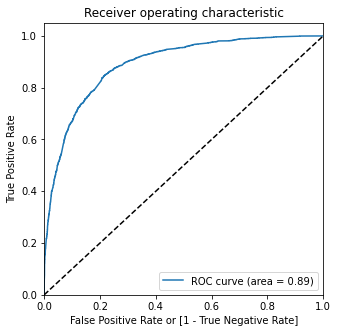

In [138]:
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Converted_Prob)

#  Finding Optimal Cutoff Point

In [139]:
# create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Converted_Prob,LeadId,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1,0.687912,6095,1,1,1,1,1,1,1,1,0,0,0
1,1,0.249584,8989,0,1,1,1,0,0,0,0,0,0,0
2,0,0.081325,7262,0,1,0,0,0,0,0,0,0,0,0
3,1,0.575456,2399,1,1,1,1,1,1,1,0,0,0,0
4,0,0.890774,8990,1,1,1,1,1,1,1,1,1,1,0


In [140]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.

cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.389750  1.000000  0.000000
0.1   0.1  0.623394  0.976127  0.398112
0.2   0.2  0.759711  0.920045  0.657309
0.3   0.3  0.798700  0.867374  0.754840
0.4   0.4  0.812878  0.775294  0.836883
0.5   0.5  0.814503  0.706328  0.883591
0.6   0.6  0.805937  0.632058  0.916989
0.7   0.7  0.780682  0.522546  0.945547
0.8   0.8  0.755871  0.426677  0.966118
0.9   0.9  0.711269  0.280030  0.986689


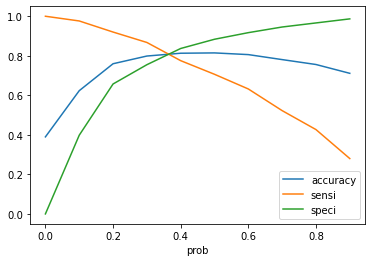

In [141]:
# Let's plot accuracy sensitivity and specificity for various probabilities.

cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

In [142]:
# Let us make the final prediction using 0.37 as the cut off

y_train_pred_final['final_predicted'] = y_train_pred_final.Converted_Prob.map( lambda x: 1 if x > 0.37 else 0)
y_train_pred_final.head()

,Converted,Converted_Prob,LeadId,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,1,0.687912,6095,1,1,1,1,1,1,1,1,0,0,0,1
1,1,0.249584,8989,0,1,1,1,0,0,0,0,0,0,0,0
2,0,0.081325,7262,0,1,0,0,0,0,0,0,0,0,0,0
3,1,0.575456,2399,1,1,1,1,1,1,1,0,0,0,0,1
4,0,0.890774,8990,1,1,1,1,1,1,1,1,1,1,0,1


In [143]:
# Now let us calculate the lead score

y_train_pred_final['lead_score'] = y_train_pred_final.Converted_Prob.map(lambda x: round(x*100))
y_train_pred_final.head(20)

,Converted,Converted_Prob,LeadId,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted,lead_score
0,1,0.687912,6095,1,1,1,1,1,1,1,1,0,0,0,1,69
1,1,0.249584,8989,0,1,1,1,0,0,0,0,0,0,0,0,25
2,0,0.081325,7262,0,1,0,0,0,0,0,0,0,0,0,0,8
3,1,0.575456,2399,1,1,1,1,1,1,1,0,0,0,0,1,58
4,0,0.890774,8990,1,1,1,1,1,1,1,1,1,1,0,1,89
5,0,0.060157,297,0,1,0,0,0,0,0,0,0,0,0,0,6
6,0,0.418522,6014,0,1,1,1,1,1,0,0,0,0,0,1,42
7,0,0.055450,7161,0,1,0,0,0,0,0,0,0,0,0,0,6
8,1,0.668177,6466,1,1,1,1,1,1,1,1,0,0,0,1,67
9,0,0.482371,3613,0,1,1,1,1,1,0,0,0,0,0,1,48


In [144]:
# Checking if 80% cases are correctly predicted based on the converted column.

# Get the total of final predicted conversion / non conversion counts from the actual converted rates

checking_df = y_train_pred_final.loc[y_train_pred_final['Converted']==1,['Converted','final_predicted']]
checking_df['final_predicted'].value_counts()

1    2180
0     459
Name: final_predicted, dtype: int64

In [145]:
# Percentage of final_predicted conversions

2180/float(2180+459)

0.8260704812428951

In [146]:
# Let's check the overall accuracy.

metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.8081524147097917

In [147]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted )
confusion2

array([[3292,  840],
       [ 459, 2180]], dtype=int64)

In [148]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [149]:
# The Sensitivity of our logistic regression model

TP / float(TP+FN)

0.8260704812428951

In [150]:
# Let us calculate specificity

TN / float(TN+FP)

0.7967086156824782

In [151]:
# Calculate false postive rate - predicting conversions when leads has not converted

print(FP/ float(TN+FP))

0.20329138431752178


In [152]:
# Positive predictive value 

print (TP / float(TP+FP))

0.7218543046357616


In [153]:
# Negative predictive value

print (TN / float(TN+ FN))

0.8776326312983205


# Metrics - Precision and Recall

In [154]:
#Looking at the confusion matrix again

confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted)
confusion

array([[3292,  840],
       [ 459, 2180]], dtype=int64)

In [155]:
from sklearn.metrics import precision_score, recall_score

In [156]:
# Precision

precision_score(y_train_pred_final.Converted, y_train_pred_final.predicted)

0.7948827292110874

In [157]:
# Recall

recall_score(y_train_pred_final.Converted, y_train_pred_final.predicted)

0.7063281546040167

# Precision and recall tradeoff

In [158]:
from sklearn.metrics import precision_recall_curve

In [159]:
y_train_pred_final.Converted, y_train_pred_final.predicted

(0       1
 1       1
 2       0
 3       1
 4       0
        ..
 6766    0
 6767    1
 6768    0
 6769    0
 6770    1
 Name: Converted, Length: 6771, dtype: int64,
 0       1
 1       0
 2       0
 3       1
 4       1
        ..
 6766    0
 6767    1
 6768    0
 6769    0
 6770    1
 Name: predicted, Length: 6771, dtype: int64)

In [160]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Converted_Prob)

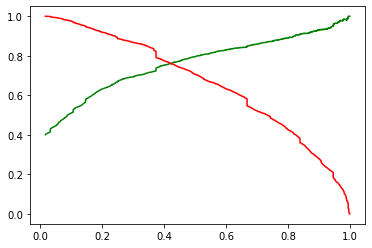

In [161]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

#  Making predictions on the test set

In [162]:
X_test[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']] = scaler.transform(X_test[['TotalVisits',
                                                                        'Total Time Spent on Website','Page Views Per Visit']])

In [163]:
X_test = X_test[col]
X_test.head()

,Do Not Email,TotalVisits,Total Time Spent on Website,LeadOrigin_Lead Add Form,LeadSource_Olark Chat,LeadSource_Welingak Website,LastActivity_Email Opened,LastActivity_Olark Chat Conversation,LastActivity_SMS Sent,LastActivity_Unsubscribed,CurrentOccupation_No Information,CurrentOccupation_Working Professional,LastNotableActivity_Modified,LastNotableActivity_Unreachable
24,0,0.3750,0.500440,0,0,0,1,0,0,0,0,0,0,0
2650,1,0.0000,0.000000,1,0,0,0,0,1,0,0,1,0,0
7082,0,0.1250,0.675176,0,0,0,0,0,1,0,0,1,0,0
6918,0,0.1875,0.073063,0,0,0,0,0,1,0,0,0,0,0
2139,0,0.3125,0.286532,0,0,0,1,0,0,0,1,0,1,0


In [164]:
X_test_sm = sm.add_constant(X_test)

In [165]:
# Making predictions on the test set
y_test_pred = res.predict(X_test_sm)
y_test_pred[:10]

24      0.623081
2650    0.978389
7082    0.990294
6918    0.407494
2139    0.086882
5523    0.004682
1756    0.378804
6584    0.015264
6703    0.006139
1556    0.146211
dtype: float64

In [166]:
# Converting y_pred to a dataframe which is an array

y_test_pred = pd.DataFrame(y_test_pred)

In [167]:
# Let's see the head

y_test_pred.head()

,0
24,0.623081
2650,0.978389
7082,0.990294
6918,0.407494
2139,0.086882


In [168]:
# Converting y_test to dataframe

y_test_df = pd.DataFrame(y_test)

In [169]:
# Putting LeadId to index

y_test_df['LeadId'] = y_test_df.index

In [170]:
# Removing index for both dataframes to append them side by side 

y_test_pred.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [171]:
# Appending y_test_df and y_pred_1

y_pred_final = pd.concat([y_test_df, y_test_pred],axis=1)

In [172]:
y_pred_final.head()

,Converted,LeadId,0
0,1,24,0.623081
1,1,2650,0.978389
2,1,7082,0.990294
3,1,6918,0.407494
4,1,2139,0.086882


In [173]:
# Renaming the column 

y_pred_final= y_pred_final.rename(columns={ 0 : 'Converted_Prob'})

In [174]:
# Rearranging the columns

y_pred_final = y_pred_final.reindex(['LeadId','Converted','Converted_Prob'], axis=1)

In [175]:
y_pred_final.head()

,LeadId,Converted,Converted_Prob
0,24,1,0.623081
1,2650,1,0.978389
2,7082,1,0.990294
3,6918,1,0.407494
4,2139,1,0.086882


In [176]:
# Based on cut off threshold using accuracy, sensitivity and specificity of 0.37%

y_pred_final['final_predicted'] = y_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.37 else 0)

In [177]:
y_pred_final.head()

,LeadId,Converted,Converted_Prob,final_predicted
0,24,1,0.623081,1
1,2650,1,0.978389,1
2,7082,1,0.990294,1
3,6918,1,0.407494,1
4,2139,1,0.086882,0


In [178]:
# Now let us calculate the lead score

y_pred_final['lead_score'] = y_pred_final.Converted_Prob.map(lambda x: round(x*100))
y_pred_final.head(20)

,LeadId,Converted,Converted_Prob,final_predicted,lead_score
0,24,1,0.623081,1,62
1,2650,1,0.978389,1,98
2,7082,1,0.990294,1,99
3,6918,1,0.407494,1,41
4,2139,1,0.086882,0,9
5,5523,0,0.004682,0,0
6,1756,0,0.378804,1,38
7,6584,0,0.015264,0,2
8,6703,0,0.006139,0,1
9,1556,0,0.146211,0,15


In [179]:
# Checking if 80% cases are correctly predicted based on the converted column.

# Get the total of final predicted conversion or non conversion counts from the actual converted rates

checking_test_df = y_pred_final.loc[y_pred_final['Converted']==1,['Converted','final_predicted']]
checking_test_df['final_predicted'].value_counts()

1    701
0    137
Name: final_predicted, dtype: int64

In [180]:
# check the precentage of final_predicted conversions on test data

701/float(701+137)

0.8365155131264916

In [181]:
# Let's check the accuracy.

metrics.accuracy_score(y_pred_final.Converted, y_pred_final.final_predicted)

0.812223206377325

In [182]:
confusion2 = metrics.confusion_matrix(y_pred_final.Converted, y_pred_final.final_predicted )
confusion2

array([[1133,  287],
       [ 137,  701]], dtype=int64)

In [183]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [184]:
# The sensitivity of our logistic regression model
TP / float(TP+FN)

0.8365155131264916

In [185]:
# Let us calculate specificity
TN / float(TN+FP)

0.797887323943662

In [186]:
# Precision and Recall metrics for the test set

# precision
print('Precision ',precision_score(y_pred_final.Converted, y_pred_final.final_predicted))

# recall
print('Recall ',recall_score(y_pred_final.Converted, y_pred_final.final_predicted))

Precision  0.7095141700404858
Recall  0.8365155131264916


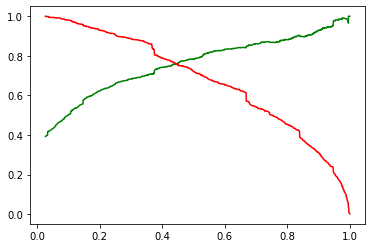

In [187]:

p, r, thresholds = precision_recall_curve(y_pred_final.Converted, y_pred_final.Converted_Prob)

plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

 * While we have checked both Sensitivity-Specificity as well as Precision and Recall Metrics, we have considered the optimal cut off based on Sensitivity and Specificity for calculating the final prediction.
  
 * Accuracy, Sensitivity and Specificity values of test set are around 81%, 83% and 78% which are approximately closer to the respective values calculated using trained set.
 
 * Also the lead score calculated shows the conversion rate on the final predicted model is around 81% (in train set) and 81% in test set.
 
* The top 3 variables that contribute for lead getting converted in the model are: 
1. Total time spent on website
2. Lead Add Form from Lead Origin
3. Welingak Website from Lead Source.

**Hence, overall this model performance is optimal.**

## Trying some more Classification Models

### Making two functions to plot the graph and evaluate the tree model

In [219]:
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(X_train[col])))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(X_train[col])))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test)))

In [217]:
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X[col].columns, 
                    class_names=['Disease', "No Disease"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [188]:
from sklearn.tree import DecisionTreeClassifier

In [208]:
dt = DecisionTreeClassifier()
dt.fit(X_train[col], y_train)

DecisionTreeClassifier()

In [249]:
evaluate_model(dt)

Train Accuracy : 0.9616009452075026
Train Confusion Matrix:
[[4063   69]
 [ 191 2448]]
--------------------------------------------------
Test Accuracy : 0.7936226749335695
Test Confusion Matrix:
[[1184  236]
 [ 230  608]]


In [209]:
from IPython.display import Image  
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz

In [211]:
# plotting tree 
dot_data = StringIO()  

export_graphviz(dt, out_file=dot_data, filled=True, rounded=True,
                feature_names=X[col].columns, 
                class_names=['No Disease', "Disease"])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())
#Image(graph.create_png(),width=800,height=900)
#graph.write_pdf("dt_heartdisease.pdf")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.441985 to fit



### Since the tree came out to be a large one, it is a good idea to tune the Hyperparameters using GridSearchCV

In [212]:
from sklearn.model_selection import GridSearchCV

In [213]:
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

In [214]:
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [215]:
%%time
grid_search.fit(X_train[col], y_train)

Fitting 4 folds for each of 50 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    4.4s


Wall time: 5.27 s


[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    5.1s finished


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [220]:
grid_search.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=5)

In [221]:
dt_best = grid_search.best_estimator_

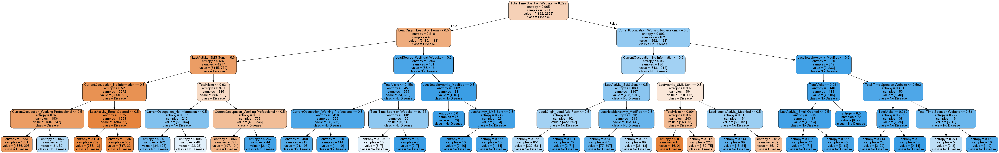

In [222]:
gph = get_dt_graph(dt_best)
Image(gph.create_png())

In [223]:
evaluate_model(dt_best)

Train Accuracy : 0.8243981686604638
Train Confusion Matrix:
[[3559  573]
 [ 616 2023]]
--------------------------------------------------
Test Accuracy : 0.8321523472099203
Test Confusion Matrix:
[[1228  192]
 [ 187  651]]


In [224]:
from sklearn.metrics import classification_report

In [227]:
print(classification_report(y_test, dt_best.predict(X_test)))

              precision    recall  f1-score   support

           0       0.87      0.86      0.87      1420
           1       0.77      0.78      0.77       838

    accuracy                           0.83      2258
   macro avg       0.82      0.82      0.82      2258
weighted avg       0.83      0.83      0.83      2258



In [228]:
imp_df = pd.DataFrame({
    "Varname": X_train[col].columns,
    "Imp": dt_best.feature_importances_})

In [229]:
imp_df.sort_values(by="Imp", ascending=False)

,Varname,Imp
2,Total Time Spent on Website,0.326766
3,LeadOrigin_Lead Add Form,0.303936
8,LastActivity_SMS Sent,0.131605
10,CurrentOccupation_No Information,0.088823
11,CurrentOccupation_Working Professional,0.085903
1,TotalVisits,0.039245
12,LastNotableActivity_Modified,0.018250
5,LeadSource_Welingak Website,0.003150
6,LastActivity_Email Opened,0.002323
0,Do Not Email,0.000000


### Creating a Random Forest Classification Model

In [230]:
from sklearn.ensemble import RandomForestClassifier

In [233]:
rf = RandomForestClassifier()
rf.fit(X_train[col], y_train)

RandomForestClassifier()

In [234]:
evaluate_model(rf)

Train Accuracy : 0.9616009452075026
Train Confusion Matrix:
[[4041   91]
 [ 169 2470]]
--------------------------------------------------
Test Accuracy : 0.8131089459698848
Test Confusion Matrix:
[[1209  211]
 [ 211  627]]


### Hyperparameter Tuning the RandomForestClassifier

In [236]:
grid_search_rf = GridSearchCV(estimator=rf, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [241]:
%%time
grid_search_rf.fit(X_train[col], y_train)

Fitting 4 folds for each of 50 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:   16.9s finished


Wall time: 17.5 s


GridSearchCV(cv=4, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [242]:
grid_search_rf.best_estimator_

RandomForestClassifier(max_depth=20, min_samples_leaf=10)

In [243]:
rf_best = grid_search_rf.best_estimator_

In [244]:
evaluate_model(rf_best)

Train Accuracy : 0.838576281199232
Train Confusion Matrix:
[[3669  463]
 [ 630 2009]]
--------------------------------------------------
Test Accuracy : 0.8401240035429584
Test Confusion Matrix:
[[1249  171]
 [ 190  648]]


In [246]:
print(classification_report(y_test, rf_best.predict(X_test[col])))

              precision    recall  f1-score   support

           0       0.87      0.88      0.87      1420
           1       0.79      0.77      0.78       838

    accuracy                           0.84      2258
   macro avg       0.83      0.83      0.83      2258
weighted avg       0.84      0.84      0.84      2258



In [247]:
imp_df = pd.DataFrame({
    "Varname": X_train[col].columns,
    "Imp": rf_best.feature_importances_})

In [248]:
imp_df.sort_values(by="Imp", ascending=False)

,Varname,Imp
2,Total Time Spent on Website,0.350828
10,CurrentOccupation_No Information,0.131998
3,LeadOrigin_Lead Add Form,0.127774
8,LastActivity_SMS Sent,0.119257
11,CurrentOccupation_Working Professional,0.090261
1,TotalVisits,0.057999
12,LastNotableActivity_Modified,0.046373
6,LastActivity_Email Opened,0.017270
7,LastActivity_Olark Chat Conversation,0.016635
4,LeadSource_Olark Chat,0.016261
